# GeoHab 2026 MLWG — Benthic Habitat Classification: Solution Pipeline

**Competition:** GeoHab 2026 MLWG Benthic Habitat Classification  
**Lock candidate:** `submission_kappa_blend_acr_alg_weighted_w0.4.csv`  
**Public LB:** 0.84950  
**Canonical pre-Bayes 150 m BlockKFold CV:** 0.7688 ± SE 0.0133 (n\_folds=5, seed=42)

## Recipe summary

| Component | Weight | Detail |
|-----------|--------|--------|
| LightGBM tabular | 0.40 | v07 86-feat + `acr_sapa_w21`, `class_weight={ALG: 2.0}` |
| CNN-v2 ensemble  | 0.60 | ResNet18 + EfficientNet-B0 + ConvNeXt-Tiny, 96×96 px, 30 epochs |
| E7 Bayesian prior adj. | post-hoc | `P_adj[c] = P_raw[c] * (test_prior[c] / train_prior[c])`, renorm, argmax |

**All parameters are frozen in the `CONFIG` dict (Section 1). No tuning occurs in this notebook.**

**CV convention (CLAUDE.md):**
OOF / fold CV is computed on *raw blend probabilities — pre-Bayes*.
Bayesian prior adjustment is applied *only at test-prediction time*, never to OOF for CV reporting.
The CNN OOF snapshot is the **last-epoch** probabilities (epoch 30/30), consistent with the no-early-stopping hard rule.
Uncertainty reported as **SE = std(fold\_f1s, ddof=1) / sqrt(n\_folds)**, not SD.

## Split-execution notes

Section 3 contains the full feature-extraction pipeline in two paths:

- **Local with WbW Pro licence** — cells marked `# REQUIRES LOCAL EXECUTION (WbW)` compute terrain derivatives using WhiteboxWorkflows for Python (conda env `wbw`). Texture features use scipy + skimage and run without WbW. Canonical implementation: `src/stage1_features.py`. Ground truth for WbW API call signatures: `docs/feature_extraction_v0.ipynb`.
- **Kaggle run** — WbW cells are skipped (`IS_KAGGLE=True`). Section 3c loads pre-computed `train_features_v07.csv` and `train_features_v09.csv` from an attached dataset.

## Notebook to-do checklist

- [ ] **§ 1** Setup & Configuration
- [ ] **§ 2** Data Loading & Brief EDA
- [ ] **§ 3** Tabular Feature Assembly
- [ ] **§ 4** Spatial CV Setup (shared verde BlockKFold, implementation-equivalence check)
- [ ] **§ 5** Tabular Component — LightGBM CV + full-train
- [ ] **§ 6** CNN-v2 Ensemble — CV + full-train
- [ ] **§ 7** k-Blend + E7 Bayesian Prior Adjustment + Submission
- [ ] **§ 8** Solution Highlights

## § 1  Setup & Configuration

In [1]:
import os, glob, json, pathlib, warnings
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, classification_report

warnings.filterwarnings('ignore')

IS_KAGGLE = os.path.exists('/kaggle/input')
print(f'Running on Kaggle: {IS_KAGGLE}')

# verde and timm are not pre-installed on Kaggle
os.system('pip install -q verde timm')

import verde as vd
import lightgbm as lgb

# ── CONFIG — every parameter in one place ────────────────────────────────────
# All values cited to their source script/file; no silent selection.
CONFIG = {
    # Reproducibility
    'SEED': 42,

    # Verde BlockKFold — SHARED by tabular and CNN (folds must be identical)
    # Source: run_v07_acr_sapa_w21_alg_weighted.py:54; cnn_v2_kaggle.py:92-94
    'BKF_SPACING':  150,   # metres
    'BKF_N_SPLITS': 5,
    'BKF_SHUFFLE':  True,
    'BKF_SEED':     42,

    # LightGBM
    # Source: generate_sub42_kappa_blend_acr_alg_weighted.py:33-38
    # Explicit defaults verified against lightgbm 4.6.0 (Session 33I env)
    'LGB_N_ESTIMATORS':      1000,
    'LGB_RANDOM_STATE':        42,
    'LGB_NUM_LEAVES':          31,
    'LGB_MAX_DEPTH':           -1,
    'LGB_LEARNING_RATE':        0.1,
    'LGB_MIN_CHILD_SAMPLES':   20,
    'LGB_FEATURE_FRACTION':     1.0,
    'LGB_BAGGING_FRACTION':     1.0,
    'LGB_BAGGING_FREQ':         0,
    'LGB_REG_ALPHA':            0.0,
    'LGB_REG_LAMBDA':           0.0,
    # class_weight: ALG (index 0) = 2.0; all other classes = 1.0
    # Source: run_v07_acr_sapa_w21_alg_weighted.py:44; CLAUDE.md class-attention note
    'LGB_ALG_WEIGHT': 2.0,

    # CNN-v2 ensemble
    # Source: cnn_v2_kaggle.py:81-98; session_33E_handoff_cnn_v2.md
    'CNN_PATCH_SIZE':          96,
    'CNN_IN_CHANNELS':          2,
    'CNN_BACKBONES':  ['resnet18', 'efficientnet_b0', 'convnext_tiny'],
    'CNN_EPOCHS':             30,    # fixed — no early stopping (hard rule)
    'CNN_LR_HEAD':             1e-3,
    'CNN_LR_BACKBONE':         1e-4,
    'CNN_WEIGHT_DECAY':        1e-4,
    'CNN_UNFREEZE_EPOCH':      6,    # 0-indexed; backbone unfreezes at start of epoch 7/30
    'CNN_DROPOUT':             0.3,
    'CNN_BATCH_SIZE':         32,
    'CNN_BATCH_SIZE_CONVNEXT': 16,   # ConvNeXt-Tiny uses more VRAM
    'CNN_NUM_WORKERS':         2,
    # Channel normalisation — Source: norm_stats.json in outputs/session_33/exp_cnn_v2_20260422_1139/
    'NORM_BATHY_MEAN': -8.581,
    'NORM_BATHY_STD':   2.936,
    'NORM_BS_MEAN':     0.569,
    'NORM_BS_STD':      0.067,

    # k-blend weights
    # Source: generate_sub42_kappa_blend_acr_alg_weighted.py:27-28
    'BLEND_W_TAB': 0.40,
    'BLEND_W_CNN': 0.60,

    # E7 Bayesian prior adjustment
    # TRAIN_PRIOR: class frequencies in data/raw/train.csv (6256 points)
    # TEST_PRIOR:  Ierodiaconou et al. (2018) Fig 7 — cited in competition description
    # CLASS_NAMES order: ALG, FMAT, NVB, SGAM, SGZ
    # Source: generate_sub42_kappa_blend_acr_alg_weighted.py:22-24
    'TRAIN_PRIOR': [0.1090, 0.2468, 0.4853, 0.0272, 0.1317],
    'TEST_PRIOR':  [0.2960, 0.1730, 0.3670, 0.0610, 0.1020],
}

CLASS_NAMES = ['ALG', 'FMAT', 'NVB', 'SGAM', 'SGZ']
LABEL_MAP   = {c: i for i, c in enumerate(CLASS_NAMES)}
NUM_CLASSES = len(CLASS_NAMES)

TRAIN_PRIOR = np.array(CONFIG['TRAIN_PRIOR'])
TEST_PRIOR  = np.array(CONFIG['TEST_PRIOR'])
BAYES_RATIO = TEST_PRIOR / (TRAIN_PRIOR + 1e-12)  # used in E7 cell

LGB_PARAMS = dict(
    n_estimators      = CONFIG['LGB_N_ESTIMATORS'],
    random_state      = CONFIG['LGB_RANDOM_STATE'],
    verbose           = -1,
    n_jobs            = -1,
    num_leaves        = CONFIG['LGB_NUM_LEAVES'],
    max_depth         = CONFIG['LGB_MAX_DEPTH'],
    learning_rate     = CONFIG['LGB_LEARNING_RATE'],
    min_child_samples = CONFIG['LGB_MIN_CHILD_SAMPLES'],
    feature_fraction  = CONFIG['LGB_FEATURE_FRACTION'],
    bagging_fraction  = CONFIG['LGB_BAGGING_FRACTION'],
    bagging_freq      = CONFIG['LGB_BAGGING_FREQ'],
    reg_alpha         = CONFIG['LGB_REG_ALPHA'],
    reg_lambda        = CONFIG['LGB_REG_LAMBDA'],
    class_weight      = {i: (CONFIG['LGB_ALG_WEIGHT'] if i == 0 else 1.0)
                         for i in range(NUM_CLASSES)},
)

# Verify LGB defaults match the version that produced the lock candidate
_p = lgb.LGBMClassifier().get_params()
assert _p['num_leaves'] == CONFIG['LGB_NUM_LEAVES'], \
    f'LGB default num_leaves={_p["num_leaves"]} differs from CONFIG — update CONFIG'
assert abs(_p['learning_rate'] - CONFIG['LGB_LEARNING_RATE']) < 1e-9, \
    f'LGB default learning_rate={_p["learning_rate"]} differs from CONFIG'
assert _p['min_child_samples'] == CONFIG['LGB_MIN_CHILD_SAMPLES'], \
    f'LGB default min_child_samples={_p["min_child_samples"]} differs from CONFIG'
print(f'lightgbm {lgb.__version__}: default params verified')
print(f'verde     {vd.__version__}')


# ── Path helpers ─────────────────────────────────────────────────────────────
def find_file(filename, search_root=None):
    """Locate filename anywhere under search_root; return parent directory path."""
    if search_root is None:
        search_root = '/kaggle' if IS_KAGGLE else '.'
    matches = glob.glob(f'{search_root}/**/{filename}', recursive=True)
    if not matches:
        raise FileNotFoundError(f'{filename!r} not found under {search_root!r}')
    if len(matches) > 1:
        print(f'WARNING: multiple matches for {filename!r}: {matches}')
    return str(pathlib.Path(matches[0]).parent)


# FIGURES resolved dynamically — independent of Kaggle dataset mount depth
FIGURES = (find_file('mstp_map.png') if IS_KAGGLE
           else '../outputs/_kaggle_features_bundle/figures')
print(f'Figures directory: {FIGURES}')


COMP_DIR   = find_file('train.csv')
SAMPLE_DIR = find_file('sample_submission.csv')
print(f'Competition data: {COMP_DIR}')

Running on Kaggle: True
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.6/188.6 kB 7.0 MB/s eta 0:00:00
lightgbm 4.6.0: default params verified
verde     v1.9.0
Figures directory: /kaggle/input/datasets/mycarta/geohab-2026-features-v07-v09/geohab-2026-features-v07-v09-upload/geohab-2026-features-v07-v09/figures
Competition data: /kaggle/input/competitions/geohab-mlwg-competition-2026


## § 2  Data Loading & Brief EDA

Load raw competition CSVs; print class distribution.
The test set has 98 points; train has 6,256. NVB dominates (48.5%); SGAM is rare (2.7%).

In [2]:
train_df = pd.read_csv(f'{COMP_DIR}/train.csv')
test_df  = pd.read_csv(f'{COMP_DIR}/test.csv')

assert len(train_df) == 6256, f'Expected 6256 train points, got {len(train_df)}'
assert len(test_df)  ==   98, f'Expected 98 test points, got {len(test_df)}'
print(f'Train: {len(train_df)} points   Test: {len(test_df)} points')

train_labels_str = train_df['class'].to_numpy()
train_labels_int = np.array([LABEL_MAP[c] for c in train_labels_str])
train_coords     = train_df[['x', 'y']].to_numpy()
n_pts            = len(train_df)

print('\nTrain class distribution:')
counts = pd.Series(train_labels_str).value_counts().reindex(CLASS_NAMES)
for cls, n in counts.items():
    print(f'  {cls}: {n:4d}  ({100*n/n_pts:4.1f}%)')

# Cross-check CONFIG TRAIN_PRIOR against actual frequencies
computed_prior = counts.values / n_pts
max_diff = np.abs(computed_prior - TRAIN_PRIOR).max()
assert max_diff < 0.001, f'TRAIN_PRIOR mismatch: max diff={max_diff:.4f} — update CONFIG'
print(f'\nCONFIG TRAIN_PRIOR matches actual frequencies (max diff={max_diff:.5f}) OK')

Train: 6256 points   Test: 98 points

Train class distribution:
  ALG:  682  (10.9%)
  FMAT: 1544  (24.7%)
  NVB: 3036  (48.5%)
  SGAM:  170  ( 2.7%)
  SGZ:  824  (13.2%)

CONFIG TRAIN_PRIOR matches actual frequencies (max diff=0.00003) OK


## § 3  Tabular Feature Assembly

### 3a  WbW terrain derivatives

`# REQUIRES LOCAL EXECUTION (WbW)` — Kaggle run loads cached output in § 3c.

Feature set v07 contains **86 features** (confirmed from `data/features/train_features_v07.csv`):
2 centre pixels · 14 WbW single-scale continuous · 2 WbW categorical ·
8 WbW multi-scale (DEVmax + roughness value+scale pairs) ·
15 bathy focal stats · 15 BS focal stats · 10 BS rank texture ·
3 HSI · 12 GLCM · 4 MSTP · 1 `bathy_canny_dist`

Ground truth for WbW API signatures: `docs/feature_extraction_v0.ipynb`  
Production implementation: `src/stage1_features.py`  
Run locally: `conda run -n wbw python src/stage1_features.py`

In [3]:
# REQUIRES LOCAL EXECUTION (WbW) — Kaggle run loads cached CSV in cell-08
# WbW Pro licence required. Env: wbw (WhiteboxWorkflows 1.3.3).
# WARNING: WbW 1.3.5 paywalls multiscale_curvatures — use 1.3.3 only.

if not IS_KAGGLE:
    import whitebox_workflows as wbw  # noqa

    wbe = wbw.WbEnvironment()
    wbe.verbose = False

    BATHY_TIF  = 'data/raw/MBES/bathymetry.tif'
    DATA_DERIV = 'data/derived'

    dem = wbe.read_raster(BATHY_TIF)

    # ── Single-scale terrain derivatives (14 continuous features) ─────────────
    slope           = wbe.slope(dem, units='degrees')
    profile_curv    = wbe.profile_curvature(dem)
    plan_curv       = wbe.plan_curvature(dem)
    max_curv        = wbe.maximum_curvature(dem)
    min_curv        = wbe.minimum_curvature(dem)
    mean_curv       = wbe.mean_curvature(dem)
    gaussian_curv   = wbe.gaussian_curvature(dem)
    tangential_curv = wbe.tangential_curvature(dem)
    total_curv      = wbe.total_curvature(dem)
    ruggedness      = wbe.ruggedness_index(dem)
    northness       = wbe.northness(dem)
    eastness        = wbe.eastness(dem)
    # ms_maxcurv value only (scale raster unused); ms_profcurv == ms_maxcurv — WbW 1.3.3 bug
    ms_maxcurv_val, _ = wbe.multiscale_curvatures(
        dem, curv_type='MaxCurvature', min_scale=3, step_size=1,
        num_steps=20, step_nonlinearity=1.0, log_transform=True)
    # dist_to_shore: SHORE_DEPTH=-16.0m, DENSIFY=0.25m, GAP_BRIDGE=5pts, MIN_SEG=3pts
    # See src/stage1_features.py for full shore-polygon construction.

    # ── Categorical landform classifiers (2 features) ─────────────────────────
    geomorphons = wbe.geomorphons(
        dem, search_distance=50, flatness_threshold=1,
        flatness_distance=5, skip_distance=2)
    pennock = wbe.pennock_landform_class(
        dem, slope_threshold=0, prof_curv_threshold=0,
        plan_curv_threshold=0.0, z_factor=1)

    # ── Multi-scale DEVmax: value + scale raster = 2 features each (8 total) ──
    devmax_local_v, devmax_local_s = wbe.max_elevation_deviation(
        dem, min_scale=3,   max_scale=20,   step_size=1)
    devmax_meso_v,  devmax_meso_s  = wbe.max_elevation_deviation(
        dem, min_scale=20,  max_scale=200,  step_size=2)
    devmax_broad_v, devmax_broad_s = wbe.max_elevation_deviation(
        dem, min_scale=200, max_scale=1000, step_size=10)
    rough_v, rough_s = wbe.multiscale_roughness(
        dem, min_scale=3,   max_scale=200,  step_size=1)

    # ── MSTP — Lindsay (2023) (4 features: band1, band2, band3, mstp_std) ─────
    # mstp_std = std([devmax_local_v, devmax_meso_v, devmax_broad_v], axis=0)
    mstp = wbe.multiscale_topographic_position_image(
        devmax_local_v, devmax_meso_v, devmax_broad_v)

    # All rasters written to DATA_DERIV for sampling in Stage 2
    # (write calls omitted here — see src/stage1_features.py)
    print('WbW terrain derivatives: DONE')

### 3b  scipy / skimage texture features + `acr_sapa_w21`

`# REQUIRES LOCAL EXECUTION (WbW)` — needs derived rasters on disk.

In [4]:
# REQUIRES LOCAL EXECUTION (WbW) — Kaggle run loads cached CSV in cell-08
# Inputs: raw bathy TIF + backscatter_destriped_masked_median2x.tif
# Destriping: Median 5x5 x1 pass (canonical filter; see notebooks/destriping_filter_explorer.ipynb)

if not IS_KAGGLE:
    import rasterio
    from rasterio.transform import rowcol
    from scipy.ndimage import uniform_filter, maximum_filter, minimum_filter
    from scipy.ndimage import distance_transform_edt
    from skimage.filters.rank import entropy as rank_entropy, gradient as rank_gradient
    from skimage.morphology import disk
    from skimage.feature import graycomatrix, graycoprops
    import cv2

    # ── Focal statistics: 3 stats x 5 windows x 2 rasters = 30 features ──────
    # Source: config.py FOCAL_WINDOWS=[3,7,11,21,41]
    # bathy_arr, bs_arr: 2D float32 arrays from rasterio (nodata -> np.nan)
    # mean  = uniform_filter(arr, size=w)
    # std   = sqrt(E[x^2] - E[x]^2) via two uniform_filter calls
    # range = maximum_filter(arr, size=w) - minimum_filter(arr, size=w)

    # ── Backscatter rank texture: 2 ops x 5 radii = 10 features ──────────────
    # Quantisation: clip BS to [-45,-5] dB -> [0,255] uint8 (0.157 dB/level)
    # Source: config.py RANK_TEXTURE_RADII=[3,7,11,17,25]
    # rank_entropy(bs_uint8, disk(r)), rank_gradient(bs_uint8, disk(r))

    # ── HSI decomposition — Che Hasan (2014) — 3 features ────────────────────
    # high-pass = bs - uniform_filter(bs, size=3)
    # low-pass  = uniform_filter(bs, size=11)
    # H, S, I from (high-pass, bs_original, low-pass) as pseudo-RGB

    # ── GLCM texture — 4 props x 3 patch sizes, avg 4 angles = 12 features ───
    # PROPERTIES: homogeneity, contrast, correlation, energy
    # NOTE: config.py lists 'dissimilarity' — THE CSV COLUMN IS 'energy' — code is truth
    # Reference: docs/run_cell6b.py (pre-crisis ground truth, 2026-04-02)
    # graycomatrix(patch_uint8, distances=[1], angles=[0,pi/4,pi/2,3pi/4],
    #              levels=256, symmetric=True, normed=True) -> graycoprops averaged

    # ── bathy_canny_dist — 1 feature ─────────────────────────────────────────
    # Rosebrock (2015) sigma=0.33 auto-threshold + scipy EDT -> metres (px * 0.25)
    # median_val  = np.median(bathy_uint8)
    # lower = int(max(0,   (1-0.33)*median_val))
    # upper = int(min(255, (1+0.33)*median_val))
    # edges = cv2.Canny(bathy_uint8, lower, upper)  # no gaussian pre-blur
    # bathy_canny_dist = distance_transform_edt(~edges.astype(bool)) * 0.25

    # ── acr_sapa_w21 — 1 feature (sourced from v09 CSV) ──────────────────────
    # SAPA = Surface Area Per unit Area rugosity, ACR method, w=21 px window
    # Source: docs/GEOHAB_orchestration_prompt.md:89; docs/DECISION_LOG.md:991-993
    # Raster: data/derived/destriped/acr_rugosity_w21.tif
    ACR_TIF = 'data/derived/destriped/acr_rugosity_w21.tif'
    with rasterio.open(ACR_TIF) as src:
        tf  = src.transform
        arr = src.read(1).astype(float)
        nd  = src.nodata
        if nd is not None:
            arr[arr == nd] = np.nan
        rows_tr, cols_tr = rowcol(tf, train_df['x'].values, train_df['y'].values)
        rows_te, cols_te = rowcol(tf, test_df['x'].values,  test_df['y'].values)
        rows_tr = np.clip(rows_tr, 0, arr.shape[0]-1)
        cols_tr = np.clip(cols_tr, 0, arr.shape[1]-1)
        rows_te = np.clip(rows_te, 0, arr.shape[0]-1)
        cols_te = np.clip(cols_te, 0, arr.shape[1]-1)
        acr_sapa_w21_train = arr[rows_tr, cols_tr]
        acr_sapa_w21_test  = arr[rows_te, cols_te]
    print(f'acr_sapa_w21 NaN: train={np.isnan(acr_sapa_w21_train).sum()}/6256 '
          f'(expected 10), test={np.isnan(acr_sapa_w21_test).sum()}/98')
    print('scipy/skimage features + acr_sapa_w21: DONE')

### 3c  Load feature CSVs (Kaggle run path)

In [5]:
# On Kaggle: loads from attached features dataset.
# Locally:   loads from data/features/ (produced by src/stage1_features.py).
FEAT_DIR = find_file('train_features_v07.csv')
print(f'Feature CSVs at: {FEAT_DIR}')

v07_train = pd.read_csv(f'{FEAT_DIR}/train_features_v07.csv')
v07_test  = pd.read_csv(f'{FEAT_DIR}/test_features_v07.csv')
v09_train = pd.read_csv(f'{FEAT_DIR}/train_features_v09.csv',
                        usecols=['x', 'y', 'acr_sapa_w21'])
v09_test  = pd.read_csv(f'{FEAT_DIR}/test_features_v09.csv',
                        usecols=['ID', 'acr_sapa_w21'])

v07_feat_cols = [c for c in v07_train.columns if c not in ('x', 'y', 'class')]
assert len(v07_feat_cols) == 86, f'Expected 86 v07 features, got {len(v07_feat_cols)}'
print(f'v07 feature columns: {len(v07_feat_cols)} (expected 86) OK')

# Coordinate alignment: v07 and v09 must describe the same 6256 points
assert np.allclose(v07_train['x'].values, v09_train['x'].values, atol=1e-4), \
    'Train v07/v09 x-coordinate mismatch'
assert np.allclose(v07_train['y'].values, v09_train['y'].values, atol=1e-4), \
    'Train v07/v09 y-coordinate mismatch'
print('Train v07/v09 coordinate alignment: PASS')

# Test ID alignment
v07_test = v07_test.sort_values('ID').reset_index(drop=True)
v09_test = v09_test.sort_values('ID').reset_index(drop=True)
assert (v07_test['ID'].values == v09_test['ID'].values).all(), \
    'Test v07/v09 ID mismatch after sort'
print('Test  v07/v09 ID alignment: PASS')

nan_tr = int(v09_train['acr_sapa_w21'].isna().sum())
nan_te = int(v09_test['acr_sapa_w21'].isna().sum())
print(f'acr_sapa_w21 NaN: train={nan_tr}/6256 (expected 10), test={nan_te}/98')
assert nan_tr == 10, f'Expected 10 train NaN for acr_sapa_w21, got {nan_tr}'

# Assemble 87-feature matrices — splice acr_sapa_w21 as column 87
X_train = np.column_stack([
    v07_train[v07_feat_cols].to_numpy(),
    v09_train['acr_sapa_w21'].to_numpy(),
])
X_test = np.column_stack([
    v07_test[v07_feat_cols].to_numpy(),
    v09_test['acr_sapa_w21'].to_numpy(),
])
feat_names   = v07_feat_cols + ['acr_sapa_w21']
tab_test_ids = v07_test['ID'].to_numpy()

assert X_train.shape == (6256, 87), f'Unexpected X_train shape: {X_train.shape}'
assert X_test.shape  == (  98, 87), f'Unexpected X_test shape:  {X_test.shape}'
print(f'X_train: {X_train.shape}   X_test: {X_test.shape}   (87 features) OK')
print('LightGBM handles acr_sapa_w21 NaN natively — no imputation.')

Feature CSVs at: /kaggle/input/datasets/mycarta/geohab-2026-features-v07-v09/geohab-2026-features-v07-v09-upload/geohab-2026-features-v07-v09
v07 feature columns: 86 (expected 86) OK
Train v07/v09 coordinate alignment: PASS
Test  v07/v09 ID alignment: PASS
acr_sapa_w21 NaN: train=10/6256 (expected 10), test=3/98
X_train: (6256, 87)   X_test: (98, 87)   (87 features) OK
LightGBM handles acr_sapa_w21 NaN natively — no imputation.


## § 4  Spatial CV Setup — shared verde BlockKFold

`verde.BlockKFold(spacing=150 m, n_splits=5, shuffle=True, random_state=42)` is used by **both** the tabular LightGBM and the CNN ensemble. Identical fold assignments are required for the blend OOF CV to be meaningful.

An implementation-equivalence check asserts point-by-point equality against the pre-computed `fold_indices.csv` from the original Sub 42 run. If that file is absent, the check is skipped.

**Session 33F audit note:** The manual BlockKFold fallback in `cnn_v2_kaggle.py` produced fold assignments differing from verde by 0.06 CV units. This notebook uses verde directly (installable via pip) and does not fall back to the manual implementation.

In [6]:
kfold = vd.BlockKFold(
    spacing      = CONFIG['BKF_SPACING'],
    n_splits     = CONFIG['BKF_N_SPLITS'],
    shuffle      = CONFIG['BKF_SHUFFLE'],
    random_state = CONFIG['BKF_SEED'],
)
# verde v1.9.0 BlockKFold.split() expects a 2D array (n, 2), not a tuple of 1D arrays.
# train_coords is already (6256, 2) from train_df[['x','y']].to_numpy() — pass directly.
splits = list(kfold.split(train_coords))

print(f'verde.BlockKFold: spacing={CONFIG["BKF_SPACING"]} m, '
      f'n_splits={CONFIG["BKF_N_SPLITS"]}, seed={CONFIG["BKF_SEED"]}')
print('Fold sizes (train / val):')
for i, (tr, va) in enumerate(splits):
    print(f'  Fold {i+1}: train={len(tr):4d}  val={len(va):4d}')

# Reconstruct per-point fold assignment
point_folds = np.full(n_pts, -1, dtype=int)
for fold_id, (_, va_idx) in enumerate(splits):
    point_folds[va_idx] = fold_id
assert (point_folds >= 0).all(), 'Some training points not assigned to any fold'
unique_folds = np.sort(np.unique(point_folds))

# Implementation-equivalence check against fold_indices.csv
try:
    fold_dir = find_file('fold_indices.csv')
    fold_ref = (pd.read_csv(f'{fold_dir}/fold_indices.csv')
                .sort_values('point_index').reset_index(drop=True))
    n_diff = int((point_folds != fold_ref['fold'].to_numpy()).sum())
    if n_diff == 0:
        print('\nImplementation-equivalence check PASS: verde matches fold_indices.csv OK')
    else:
        print(f'\nWARNING: {n_diff}/{n_pts} assignments differ from fold_indices.csv.')
        print('Possible verde version change. Proceeding with verde-generated folds.')
        print('CV may differ slightly from the registered 0.7688 +/- 0.0133.')
except FileNotFoundError:
    print('\nfold_indices.csv not found — equivalence check skipped, verde folds used.')

verde.BlockKFold: spacing=150 m, n_splits=5, seed=42
Fold sizes (train / val):
  Fold 1: train=5362  val= 894
  Fold 2: train=4727  val=1529
  Fold 3: train=5135  val=1121
  Fold 4: train=5021  val=1235
  Fold 5: train=4779  val=1477

Implementation-equivalence check PASS: verde matches fold_indices.csv OK


## § 5  Tabular Component — LightGBM

**Hard rules (non-negotiable):**
- `n_estimators=1000` fixed — no early stopping, no `eval_set`, no callbacks
- `class_weight={ALG: 2.0, others: 1.0}` — recovers ALG F1 regression caused by `acr_sapa_w21` split-attention side effect (CLAUDE.md class-attention methodology note)
- CV metric: weighted F1 on **pre-Bayes OOF probabilities**

Expected OOF CV: ~**0.7510** (150 m BlockKFold, seed=42; registered Sub 41)

In [7]:
print('LightGBM CV — 5-fold 150m BlockKFold (pre-Bayes OOF)')

tab_oof = np.zeros((n_pts, NUM_CLASSES), dtype=np.float64)

for fold_id in unique_folds:
    tr_idx = np.where(point_folds != fold_id)[0]
    va_idx = np.where(point_folds == fold_id)[0]

    clf = lgb.LGBMClassifier(**LGB_PARAMS)
    clf.fit(X_train[tr_idx], train_labels_int[tr_idx])

    if fold_id == unique_folds[0]:
        assert list(clf.classes_) == list(range(NUM_CLASSES)), \
            f'Unexpected class ordering from LGB: {clf.classes_}'
        print(f'  clf.classes_ verified: {list(clf.classes_)} (matches LABEL_MAP) OK')

    tab_oof[va_idx] = clf.predict_proba(X_train[va_idx])
    fold_f1 = f1_score(train_labels_int[va_idx], tab_oof[va_idx].argmax(1), average='weighted')
    print(f'  Fold {fold_id}: n_val={len(va_idx):4d}  F1={fold_f1:.4f}')

# OOF CV (pre-Bayes)
tab_fold_f1s = np.array([
    f1_score(train_labels_int[point_folds == f],
             tab_oof[point_folds == f].argmax(1), average='weighted')
    for f in unique_folds
])
tab_cv_mean = float(tab_fold_f1s.mean())
tab_cv_se   = float(tab_fold_f1s.std(ddof=1) / np.sqrt(len(unique_folds)))
print(f'\nTabular OOF CV (pre-Bayes): {tab_cv_mean:.4f} +/- SE {tab_cv_se:.4f}')
print(f'  per-fold: {tab_fold_f1s.round(4).tolist()}')
print(f'  Registered expectation: ~0.7510 (Sub 41, seed=42)')
assert np.allclose(tab_oof.sum(1), 1.0, atol=1e-6)

LightGBM CV — 5-fold 150m BlockKFold (pre-Bayes OOF)
  clf.classes_ verified: [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4)] (matches LABEL_MAP) OK
  Fold 0: n_val= 894  F1=0.6911
  Fold 1: n_val=1529  F1=0.7531
  Fold 2: n_val=1121  F1=0.8126
  Fold 3: n_val=1235  F1=0.7067
  Fold 4: n_val=1477  F1=0.7961

Tabular OOF CV (pre-Bayes): 0.7519 +/- SE 0.0238
  per-fold: [0.6911, 0.7531, 0.8126, 0.7067, 0.7961]
  Registered expectation: ~0.7510 (Sub 41, seed=42)


In [8]:
# Full-train refit -> tab_test_proba
print('LightGBM full-train refit on all 6256 points...')
clf_full = lgb.LGBMClassifier(**LGB_PARAMS)
clf_full.fit(X_train, train_labels_int)
assert list(clf_full.classes_) == list(range(NUM_CLASSES))

tab_test_proba = clf_full.predict_proba(X_test)  # (98, 5)
assert tab_test_proba.shape == (98, NUM_CLASSES)
assert np.allclose(tab_test_proba.sum(1), 1.0, atol=1e-6)
print(f'tab_test_proba: {tab_test_proba.shape}  sums-to-1 OK')

# Feature importance (gain) — top-10
imp_gain = clf_full.booster_.feature_importance(importance_type='gain').astype(float)
imp_df = (pd.DataFrame({'feature': feat_names, 'gain': imp_gain})
          .sort_values('gain', ascending=False)
          .reset_index(drop=True))
imp_df['rank'] = imp_df.index + 1
sapa_row = imp_df[imp_df['feature'] == 'acr_sapa_w21'].iloc[0]
print(f'acr_sapa_w21: rank {int(sapa_row["rank"])}/87, gain={sapa_row["gain"]:.0f}')
print(f'  Registered: rank 1/87, gain ~23646 (Sub 41 full-train)')
print('\nTop-10 features by gain:')
print(imp_df[['rank', 'feature', 'gain']].head(10).to_string(index=False))

LightGBM full-train refit on all 6256 points...
tab_test_proba: (98, 5)  sums-to-1 OK
acr_sapa_w21: rank 1/87, gain=23646
  Registered: rank 1/87, gain ~23646 (Sub 41 full-train)

Top-10 features by gain:
 rank               feature         gain
    1          acr_sapa_w21 23646.446729
    2  multiscale_roughness 20134.046351
    3     bs_focal_mean_w41  7136.868401
    4      bathy_canny_dist  5614.539917
    5         dist_to_shore  5361.895315
    6  bathy_focal_mean_w21  4916.333765
    7                 bathy  3252.951971
    8    devmax_broad_scale  3094.733525
    9 bathy_focal_range_w41  2851.099825
   10          devmax_broad  2749.746077


## § 6  CNN-v2 Ensemble

3-backbone soft-vote ensemble: **ResNet18 + EfficientNet-B0 + ConvNeXt-Tiny**

- ImageNet-pretrained; first conv adapted by averaging RGB weights into 2 input channels
- Input: 96×96 patches, ch0 = FFT-destriped bathy, ch1 = FFT-destriped backscatter
- 30 epochs fixed (no early stopping); AdamW; cosine LR schedule; backbone frozen epochs 0-5
- Augmentation: rot90 (k=0..3), HFlip (p=0.5), VFlip (p=0.5) — no brightness jitter
- **OOF snapshot: last-epoch probabilities (epoch 29/30)** — consistent with no-ES rule

Expected ensemble CV (pre-Bayes, verde BKF canonical): ~**0.7254** (Session 33F audit)

**Path A** (train from scratch) is preserved below as non-executing markdown for methodological transparency.  
**Path B** (executed): deterministic reproduction via `ensemble_outputs.npz` — loads in ~1 s. (confirmed: Subs 37+38 completed on T4).

### Path A — train from scratch (preserved for methodological transparency, not executed in this notebook)

```python
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import timm

torch.manual_seed(CONFIG['SEED'])
np.random.seed(CONFIG['SEED'])

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {DEVICE}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')

# ── Load patches from mycarta/geohab-cnn-patches ─────────────────────────────
# Patches pre-extracted from destriped rasters; uploaded as a Kaggle dataset.
# ch0: FFT-destriped bathy  (norm: mean=-8.581, std=2.936)
# ch1: FFT-destriped BS     (norm: mean=0.569,  std=0.067)
# Source: outputs/session_33/exp_cnn_v2_20260422_1139/
PATCH_DIR = find_file('train_patches.npz')
print(f'Patch directory: {PATCH_DIR}')

_tr = np.load(f'{PATCH_DIR}/train_patches.npz')
train_patches  = _tr['patches']   # (6256, 2, 96, 96) float32
train_ptlabels = _tr['labels']    # (6256,) int64

_te = np.load(f'{PATCH_DIR}/test_patches.npz')
test_patches = _te['patches']     # (98, 2, 96, 96) float32
cnn_test_ids = _te['ids']         # (98,) int64

assert train_patches.shape == (6256, 2, 96, 96), f'Bad train patch shape: {train_patches.shape}'
assert test_patches.shape  == (  98, 2, 96, 96), f'Bad test patch shape:  {test_patches.shape}'
assert (train_ptlabels == train_labels_int).all(), \
    'Patch labels do not match train.csv — patches extracted from a different dataset'

# Ensure CNN test ID order matches tabular test ID order
if not (cnn_test_ids == tab_test_ids).all():
    tab_sort = np.argsort(tab_test_ids)
    cnn_sort = np.argsort(cnn_test_ids)
    assert (tab_test_ids[tab_sort] == cnn_test_ids[cnn_sort]).all(), \
        'CNN and tabular test IDs cannot be reconciled'
    test_patches = test_patches[cnn_sort][np.argsort(tab_sort)]
    print('Reordered CNN test patches to match tabular ID order.')
print(f'Train: {train_patches.shape}  Test: {test_patches.shape}  ID order OK')
```


### Path A — train from scratch (preserved for methodological transparency, not executed in this notebook)

```python
class SeabedDataset(Dataset):
    def __init__(self, patches, labels=None, augment=False):
        self.patches = torch.from_numpy(patches.copy())
        self.labels  = torch.from_numpy(labels).long() if labels is not None else None
        self.augment = augment

    def __len__(self): return len(self.patches)

    def __getitem__(self, idx):
        x = self.patches[idx].clone()
        if self.augment:
            x = torch.rot90(x, np.random.randint(4), dims=[1, 2])
            if np.random.random() > 0.5: x = torch.flip(x, dims=[2])
            if np.random.random() > 0.5: x = torch.flip(x, dims=[1])
        return (x, self.labels[idx]) if self.labels is not None else x


def _replace_first_conv(model, timm_name, in_ch):
    """Average ImageNet RGB weights -> in_ch channels; replace first conv."""
    if timm_name.startswith('resnet'):
        old = model.conv1
        new = nn.Conv2d(in_ch, old.out_channels, old.kernel_size, old.stride, old.padding, bias=False)
        new.weight.data = old.weight.data.mean(dim=1, keepdim=True).repeat(1, in_ch, 1, 1)
        model.conv1 = new
    elif timm_name.startswith('efficientnet'):
        old = model.conv_stem
        new = nn.Conv2d(in_ch, old.out_channels, old.kernel_size, old.stride, old.padding, bias=False)
        new.weight.data = old.weight.data.mean(dim=1, keepdim=True).repeat(1, in_ch, 1, 1)
        model.conv_stem = new
    elif timm_name.startswith('convnext'):
        old = model.stem[0]
        new = nn.Conv2d(in_ch, old.out_channels, old.kernel_size, old.stride, old.padding,
                        bias=old.bias is not None)
        new.weight.data = old.weight.data.mean(dim=1, keepdim=True).repeat(1, in_ch, 1, 1)
        if old.bias is not None: new.bias.data = old.bias.data
        model.stem[0] = new
    return model


def create_model(timm_name):
    model = timm.create_model(timm_name, pretrained=True, num_classes=NUM_CLASSES)
    model = _replace_first_conv(model, timm_name, CONFIG['CNN_IN_CHANNELS'])
    drop  = CONFIG['CNN_DROPOUT']
    if hasattr(model, 'fc'):
        model.fc = nn.Sequential(nn.Dropout(drop), nn.Linear(model.fc.in_features, NUM_CLASSES))
    elif hasattr(model, 'classifier'):
        model.classifier = nn.Sequential(nn.Dropout(drop),
                                         nn.Linear(model.classifier.in_features, NUM_CLASSES))
    elif hasattr(model, 'head'):
        in_f = model.head.fc.in_features if hasattr(model.head, 'fc') else model.head.in_features
        layer = nn.Sequential(nn.Dropout(drop), nn.Linear(in_f, NUM_CLASSES))
        if hasattr(model.head, 'fc'): model.head.fc = layer
        else: model.head = layer
    return model


def get_param_groups(model, timm_name):
    head = {'fc'} if timm_name.startswith('resnet') else \
           {'classifier'} if timm_name.startswith('efficientnet') else {'head'}
    bp, hp = [], []
    for n, p in model.named_parameters():
        (hp if n.split('.')[0] in head else bp).append(p)
    return bp, hp


print('SeabedDataset + model factory defined.')
```


### Path A — train from scratch (preserved for methodological transparency, not executed in this notebook)

```python
def train_one_fold(timm_name, train_dl, val_dl):
    """Train one fold for CNN_EPOCHS; return (model, last_epoch_val_proba, val_labels).

    The OOF snapshot is the LAST epoch (not best-epoch), consistent with the
    no-early-stopping hard rule and with how the lock candidate OOF was produced.
    """
    model = create_model(timm_name).to(DEVICE)
    bp, hp = get_param_groups(model, timm_name)
    for p in bp: p.requires_grad = False  # frozen until CNN_UNFREEZE_EPOCH

    optimizer = torch.optim.AdamW(
        [{'params': bp, 'lr': CONFIG['CNN_LR_BACKBONE']},
         {'params': hp, 'lr': CONFIG['CNN_LR_HEAD']}],
        weight_decay=CONFIG['CNN_WEIGHT_DECAY'])
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=CONFIG['CNN_EPOCHS'])
    criterion = nn.CrossEntropyLoss()

    last_proba, last_lbls = None, None

    for epoch in range(CONFIG['CNN_EPOCHS']):
        if epoch == CONFIG['CNN_UNFREEZE_EPOCH']:
            for p in bp: p.requires_grad = True

        model.train()
        for Xb, yb in train_dl:
            Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)
            optimizer.zero_grad()
            criterion(model(Xb), yb).backward()
            optimizer.step()
        scheduler.step()

        model.eval()
        probas, lbls = [], []
        with torch.no_grad():
            for Xb, yb in val_dl:
                probas.append(torch.softmax(model(Xb.to(DEVICE)), 1).cpu().numpy())
                lbls.extend(yb.numpy())
        last_proba = np.concatenate(probas, axis=0)
        last_lbls  = np.array(lbls)

        if (epoch + 1) % 5 == 0:
            ep_f1 = f1_score(last_lbls, last_proba.argmax(1), average='weighted')
            print(f'    epoch {epoch+1:2d}/{CONFIG["CNN_EPOCHS"]}  val_F1={ep_f1:.4f}')

    return model, last_proba, last_lbls


print('train_one_fold defined.')
```


### Path A — train from scratch (preserved for methodological transparency, not executed in this notebook)

```python
# ── CNN CV — 3 backbones x 5 folds (~1.5-2 h on Kaggle T4) ──────────────────
cnn_oof_per_bb = {}   # timm_name -> (6256, 5) float32
cnn_cv_results = {}

for bb in CONFIG['CNN_BACKBONES']:
    print(f'\n{"="*60}\nBackbone: {bb}\n{"="*60}')
    oof_full  = np.zeros((n_pts, NUM_CLASSES), dtype=np.float32)
    fold_f1s  = []

    for fold_id, (tr_idx, va_idx) in enumerate(splits):
        bs = CONFIG['CNN_BATCH_SIZE_CONVNEXT'] if 'convnext' in bb \
             else CONFIG['CNN_BATCH_SIZE']
        print(f'  Fold {fold_id+1}/{CONFIG["BKF_N_SPLITS"]} '
              f'(train={len(tr_idx)}, val={len(va_idx)}, bs={bs})')

        tr_ds = SeabedDataset(train_patches[tr_idx], train_ptlabels[tr_idx], augment=True)
        va_ds = SeabedDataset(train_patches[va_idx], train_ptlabels[va_idx], augment=False)
        tr_dl = DataLoader(tr_ds, batch_size=bs, shuffle=True,
                           num_workers=CONFIG['CNN_NUM_WORKERS'], pin_memory=True)
        va_dl = DataLoader(va_ds, batch_size=bs, shuffle=False,
                           num_workers=CONFIG['CNN_NUM_WORKERS'], pin_memory=True)

        model, fold_proba, fold_lbls = train_one_fold(bb, tr_dl, va_dl)
        oof_full[va_idx] = fold_proba
        f1 = f1_score(fold_lbls, fold_proba.argmax(1), average='weighted')
        fold_f1s.append(f1)
        print(f'  Fold {fold_id+1} F1 (last epoch): {f1:.4f}')

        torch.save(model.state_dict(), f'/kaggle/working/{bb}_fold{fold_id}.pt')
        del model
        if DEVICE.type == 'cuda': torch.cuda.empty_cache()

    bb_mean = float(np.mean(fold_f1s))
    bb_se   = float(np.std(fold_f1s, ddof=1) / np.sqrt(CONFIG['BKF_N_SPLITS']))
    cnn_cv_results[bb]  = {'mean': bb_mean, 'se': bb_se, 'fold_f1s': fold_f1s}
    cnn_oof_per_bb[bb]  = oof_full
    print(f'\n{bb}: CV={bb_mean:.4f} +/- SE {bb_se:.4f}')
```


### Path A — train from scratch (preserved for methodological transparency, not executed in this notebook)

```python
# Ensemble OOF (soft vote: mean of 3 backbones)
cnn_oof = np.mean([cnn_oof_per_bb[k] for k in CONFIG['CNN_BACKBONES']], axis=0)  # (6256,5)

cnn_fold_f1s = np.array([
    f1_score(train_labels_int[point_folds == f],
             cnn_oof[point_folds == f].argmax(1), average='weighted')
    for f in unique_folds
])
cnn_cv_mean = float(cnn_fold_f1s.mean())
cnn_cv_se   = float(cnn_fold_f1s.std(ddof=1) / np.sqrt(len(unique_folds)))

print('CNN-v2 CV summary (pre-Bayes, last-epoch OOF, soft vote):')
for bb in CONFIG['CNN_BACKBONES']:
    r = cnn_cv_results[bb]
    print(f'  {bb:25s}: {r["mean"]:.4f} +/- SE {r["se"]:.4f}')
print(f'  {"Ensemble":25s}: {cnn_cv_mean:.4f} +/- SE {cnn_cv_se:.4f}')
print(f'  Registered (verde canonical):  ~0.7254 (Session 33F audit)')

print('\nPer-class F1 (ensemble OOF, pre-Bayes):')
print(classification_report(train_labels_int, cnn_oof.argmax(1),
                             target_names=CLASS_NAMES, digits=4))

# Full-train refit x 3 backbones -> cnn_test_proba
print('\nCNN full-train refit (3 backbones, all 6256 points)...')
cnn_test_per_bb = {}

for bb in CONFIG['CNN_BACKBONES']:
    print(f'  {bb}...')
    bs = CONFIG['CNN_BATCH_SIZE_CONVNEXT'] if 'convnext' in bb else CONFIG['CNN_BATCH_SIZE']

    full_ds = SeabedDataset(train_patches, train_ptlabels, augment=True)
    test_ds  = SeabedDataset(test_patches,  augment=False)
    full_dl  = DataLoader(full_ds, batch_size=bs, shuffle=True,
                          num_workers=CONFIG['CNN_NUM_WORKERS'], pin_memory=True)
    test_dl  = DataLoader(test_ds,  batch_size=bs, shuffle=False,
                          num_workers=CONFIG['CNN_NUM_WORKERS'], pin_memory=True)

    model = create_model(bb).to(DEVICE)
    bp, hp = get_param_groups(model, bb)
    for p in bp: p.requires_grad = False
    optimizer = torch.optim.AdamW(
        [{'params': bp, 'lr': CONFIG['CNN_LR_BACKBONE']},
         {'params': hp, 'lr': CONFIG['CNN_LR_HEAD']}],
        weight_decay=CONFIG['CNN_WEIGHT_DECAY'])
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=CONFIG['CNN_EPOCHS'])

    for epoch in range(CONFIG['CNN_EPOCHS']):
        if epoch == CONFIG['CNN_UNFREEZE_EPOCH']:
            for p in bp: p.requires_grad = True
        model.train()
        for Xb, yb in full_dl:
            Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)
            optimizer.zero_grad()
            nn.CrossEntropyLoss()(model(Xb), yb).backward()
            optimizer.step()
        scheduler.step()
        if (epoch + 1) % 10 == 0:
            print(f'    epoch {epoch+1}/{CONFIG["CNN_EPOCHS"]}')

    model.eval()
    proba_list = []
    with torch.no_grad():
        for Xb in test_dl:
            proba_list.append(torch.softmax(model(Xb.to(DEVICE)), 1).cpu().numpy())
    cnn_test_per_bb[bb] = np.concatenate(proba_list, axis=0)
    torch.save(model.state_dict(), f'/kaggle/working/{bb}_full.pt')
    del model
    if DEVICE.type == 'cuda': torch.cuda.empty_cache()

cnn_test_proba = np.mean([cnn_test_per_bb[k] for k in CONFIG['CNN_BACKBONES']], axis=0)
assert cnn_test_proba.shape == (98, NUM_CLASSES)
assert np.allclose(cnn_test_proba.sum(1), 1.0, atol=1e-5)
print(f'\ncnn_test_proba: {cnn_test_proba.shape}  sums-to-1 OK')
```


### Path B — load pre-computed CNN ensemble outputs (executed)

This notebook executes Path B: deterministic reproduction of the lock candidate by loading pre-computed CNN ensemble outputs from the original training run. Path A (full training from raw patches) is preserved above as commented code for methodological transparency, but is not executed because CNN inference is not bit-deterministic across hardware. A reader running Path A should expect to reproduce the method and a submission within a few borderline-point flips of the lock candidate, not byte-equivalence.


In [9]:
# Path B — load ensemble_outputs.npz (~1 s vs ~2 h for Path A)
_npz_dir = find_file('ensemble_outputs.npz')
arr = np.load(f'{_npz_dir}/ensemble_outputs.npz')

cnn_oof        = arr['oof'].astype(np.float64)       # (6256, 5) ensemble OOF
cnn_test_proba = arr['test_raw'].astype(np.float64)  # (98, 5) pre-Bayes CNN test proba
cnn_test_adj   = arr['test_adj']                      # (98, 5) CNN-only Bayes-adj (reference)

assert cnn_oof.shape        == (6256, NUM_CLASSES)
assert cnn_test_proba.shape == (98,   NUM_CLASSES)
assert np.allclose(cnn_oof.sum(1),        1.0, atol=1e-5)
assert np.allclose(cnn_test_proba.sum(1), 1.0, atol=1e-5)
print(f'cnn_oof:        {cnn_oof.shape}  sums-to-1 OK')
print(f'cnn_test_proba: {cnn_test_proba.shape}  sums-to-1 OK')
print(f'Loaded from: {_npz_dir}')


cnn_oof:        (6256, 5)  sums-to-1 OK
cnn_test_proba: (98, 5)  sums-to-1 OK
Loaded from: /kaggle/input/datasets/mycarta/geohab-2026-features-v07-v09


## § 7  k-Blend + E7 Bayesian Prior Adjustment + Submission

**OOF blend CV (pre-Bayes) — Section 7a:**

```
blend_oof[i]  = 0.40 * tab_oof[i] + 0.60 * cnn_oof[i]
fold_f1[k]    = weighted_F1(blend_oof[val_k].argmax(1), labels[val_k])
CV            = mean(fold_f1s)  +/-  SE = std(fold_f1s, ddof=1) / sqrt(5)
```

Expected: **0.7688 +/- SE 0.0133** (lock candidate `submission_kappa_blend_acr_alg_weighted_w0.4.csv`)

Note: CNN training is stochastic (DataLoader worker ordering may vary by GPU); exact
reproduction is expected to within ~0.005.

**Test prediction — Section 7b:**

```
blend_raw[i]  = 0.40 * tab_test_proba[i] + 0.60 * cnn_test_proba[i]
P_adj[i, c]   = blend_raw[i, c] * (TEST_PRIOR[c] / TRAIN_PRIOR[c])   # E7 Bayes
P_adj[i]     /= sum(P_adj[i])                                          # renormalise
label[i]      = CLASS_NAMES[argmax(P_adj[i])]
```

Prior ratios (Ierodiaconou 2018 Fig 7): ALG x2.72, FMAT x0.70, NVB x0.76, SGAM x2.25, SGZ x0.78

**CV convention note:** OOF CV is always pre-Bayes. Applying Bayes before fold CV gives ~0.7303 (-0.0345 undercount), which would trigger a false gate failure. Verified in Session 33H. Do not apply Bayes to OOF.

In [10]:
W_TAB = CONFIG['BLEND_W_TAB']
W_CNN = CONFIG['BLEND_W_CNN']

# OOF blend (pre-Bayes)
blend_oof = W_TAB * tab_oof + W_CNN * cnn_oof  # (6256, 5)
assert np.allclose(blend_oof.sum(1), 1.0, atol=1e-5)

blend_fold_f1s = np.array([
    f1_score(train_labels_int[point_folds == f],
             blend_oof[point_folds == f].argmax(1), average='weighted')
    for f in unique_folds
])
blend_cv_mean = float(blend_fold_f1s.mean())
blend_cv_se   = float(blend_fold_f1s.std(ddof=1) / np.sqrt(len(unique_folds)))

print(f'k-Blend OOF CV (pre-Bayes, w_tab={W_TAB}, w_cnn={W_CNN}):')
print(f'  mean = {blend_cv_mean:.4f}')
print(f'  SE   = {blend_cv_se:.4f}  [std / sqrt({len(unique_folds)})]')
print(f'  SD   = {blend_fold_f1s.std(ddof=1):.4f}')
print(f'  per-fold: {blend_fold_f1s.round(4).tolist()}')
print(f'  Registered target: 0.7688 +/- SE 0.0133')

if abs(blend_cv_mean - 0.7688) > 0.01:
    print('WARNING: blend CV deviates >0.01 from registered 0.7688.')
    print('  Check fold structure (verde version) and random seeds.')
else:
    print(f'  Deviation {abs(blend_cv_mean-0.7688):.4f} — within expected stochastic range OK')

print('\nBlend OOF per-class F1 (pre-Bayes):')
print(classification_report(train_labels_int, blend_oof.argmax(1),
                             target_names=CLASS_NAMES, digits=4))

k-Blend OOF CV (pre-Bayes, w_tab=0.4, w_cnn=0.6):
  mean = 0.7688
  SE   = 0.0133  [std / sqrt(5)]
  SD   = 0.0298
  per-fold: [0.7841, 0.7642, 0.8078, 0.7606, 0.7274]
  Registered target: 0.7688 +/- SE 0.0133
  Deviation 0.0000 — within expected stochastic range OK

Blend OOF per-class F1 (pre-Bayes):
              precision    recall  f1-score   support

         ALG     0.6924    0.7361    0.7136       682
        FMAT     0.7820    0.6205    0.6919      1544
         NVB     0.8194    0.9328    0.8725      3036
        SGAM     0.4268    0.3941    0.4098       170
         SGZ     0.6811    0.5728    0.6223       824

    accuracy                         0.7722      6256
   macro avg     0.6803    0.6513    0.6620      6256
weighted avg     0.7675    0.7722    0.7651      6256



In [11]:
# ── Test blend ────────────────────────────────────────────────────────────────
blend_raw = W_TAB * tab_test_proba + W_CNN * cnn_test_proba  # (98, 5)
assert blend_raw.shape == (98, NUM_CLASSES)
assert np.allclose(blend_raw.sum(1), 1.0, atol=1e-5)

# ── E7 Bayesian prior adjustment ──────────────────────────────────────────────
# P_adj[c] = P_raw[c] * (TEST_PRIOR[c] / TRAIN_PRIOR[c]), then renormalise
# Applied to TEST predictions ONLY — never to OOF (CLAUDE.md Pre-Bayes OOF Convention)
# Source: generate_sub42_kappa_blend_acr_alg_weighted.py:133-134
# Priors: Ierodiaconou et al. (2018) Fig 7
print('E7 Bayesian prior adjustment ratios (TEST_PRIOR / TRAIN_PRIOR):')
for c, r in zip(CLASS_NAMES, BAYES_RATIO):
    print(f'  {c}: {r:.4f}')

blend_adj = blend_raw * BAYES_RATIO[np.newaxis, :]
blend_adj /= blend_adj.sum(axis=1, keepdims=True)
assert np.allclose(blend_adj.sum(1), 1.0, atol=1e-6)

preds_int = blend_adj.argmax(axis=1)
preds_str = [CLASS_NAMES[p] for p in preds_int]

print('\nTest prediction class distribution:')
dist = pd.Series(preds_str).value_counts().reindex(CLASS_NAMES, fill_value=0)
for cls, cnt in dist.items():
    print(f'  {cls}: {cnt}')
print('  Registered (lock candidate): ALG=25, FMAT=18, NVB=40, SGAM=9, SGZ=6')

# ── Build submission CSV ──────────────────────────────────────────────────────
# Column name 'class' matches sample_submission.csv (verified from competition data)
sample_sub = pd.read_csv(f'{SAMPLE_DIR}/sample_submission.csv')
assert list(sample_sub.columns) == ['ID', 'class'], \
    f'Unexpected sample_submission columns: {sample_sub.columns.tolist()}'

sub_df = (pd.DataFrame({'ID': tab_test_ids, 'class': preds_str})
          .set_index('ID')
          .reindex(sample_sub['ID'].values)
          .reset_index())

assert len(sub_df) == 98,                   'Submission row count != 98'
assert sub_df['class'].isna().sum() == 0,   'NaN in class column'
assert set(sub_df['class']) == set(CLASS_NAMES), \
    f'Missing class: {set(CLASS_NAMES) - set(sub_df["class"])}'


out_path = '/kaggle/working/submission_kappa_blend_acr_alg_weighted_w0.4.csv'
sub_df.to_csv(out_path, index=False)
sub_df.to_csv('/kaggle/working/submission.csv', index=False)  # for Kaggle auto-scoring


print(f'\nSubmission saved: {out_path}')
print(f'Rows: {len(sub_df)}  Columns: {sub_df.columns.tolist()}')
print(f'\nFirst 5 rows:')
print(sub_df.head().to_string(index=False))
print('\nRegistered public LB for this recipe: 0.84950')

E7 Bayesian prior adjustment ratios (TEST_PRIOR / TRAIN_PRIOR):
  ALG: 2.7156
  FMAT: 0.7010
  NVB: 0.7562
  SGAM: 2.2426
  SGZ: 0.7745

Test prediction class distribution:
  ALG: 25
  FMAT: 18
  NVB: 40
  SGAM: 9
  SGZ: 6
  Registered (lock candidate): ALG=25, FMAT=18, NVB=40, SGAM=9, SGZ=6

Submission saved: /kaggle/working/submission_kappa_blend_acr_alg_weighted_w0.4.csv
Rows: 98  Columns: ['ID', 'class']

First 5 rows:
 ID class
  1   ALG
  2   ALG
  3   NVB
  4   NVB
  5   SGZ

Registered public LB for this recipe: 0.84950


In [12]:
# Path B integrity check — confirms ensemble outputs loaded correctly
assert np.allclose(cnn_test_proba, arr['test_raw'], atol=1e-6), \
    "CNN test probabilities don't match saved npz — file corrupted or wrong version"
assert np.allclose(cnn_oof, arr['oof'], atol=1e-6), \
    "CNN OOF probabilities don't match saved npz"

# Lock candidate sanity check — final submission class counts
expected_counts = {'ALG': 25, 'FMAT': 18, 'NVB': 40, 'SGAM': 9, 'SGZ': 6}
final_classes = pd.Series(sub_df['class']).value_counts().to_dict()
assert final_classes == expected_counts, \
    f"Submission class counts {final_classes} != lock candidate {expected_counts}"
print("✓ Path B integrity verified — submission matches lock candidate")


✓ Path B integrity verified — submission matches lock candidate


In [13]:
# Bayes flip diagnostic — which test points changed class after E7 adjustment?
pre_int = blend_raw.argmax(axis=1)
pre_str = [CLASS_NAMES[p] for p in pre_int]

diffs = [(tab_test_ids[i], pre_str[i], preds_str[i])
         for i in range(98) if pre_str[i] != preds_str[i]]

print(f'Bayes flip count: {len(diffs)} / 98\n')
if diffs:
    print(f'{"ID":>6}  {"pre_class":>10}  {"post_class":>10}')
    print('-' * 32)
    for id_, pre, post in diffs:
        print(f'{id_:>6}  {pre:>10}  {post:>10}')


Bayes flip count: 3 / 98

    ID   pre_class  post_class
--------------------------------
     7        FMAT        SGAM
    11         NVB         ALG
    49         NVB         ALG


## § 8  Solution Highlights

**Competition:** GeoHab 2026 MLWG Benthic Habitat Classification  
**Survey area:** Refuge Cove, SE Victoria, Australia (Ierodiaconou et al. 2018)

### Results

| Metric | Value |
|--------|-------|
| Public LB (weighted F1, 30% split) | **0.84950** |
| Honest CV (150 m BlockKFold, pre-Bayes OOF) | 0.7688 ± SE 0.0133 |
| Submission file | `submission_kappa_blend_acr_alg_weighted_w0.4.csv` |

### Recipe

Two-component κ-weighted blend with E7 Bayesian prior adjustment at test time:

```
pred = argmax( Bayes_adj( 0.40 × LGB_proba + 0.60 × CNN_ensemble_proba ) )
```

**Tabular component (w = 0.40)** — LightGBM, n_estimators=1000, on 87 features:

- **v07 baseline (86 features):** WbW multi-scale terrain (DEVmax local/meso/broad + scale rasters, multiscale roughness + scale, ms_maxcurv); single-scale curvatures (profile, plan, max, min, mean, Gaussian, tangential, total) + northness, eastness, ruggedness index; bathy and backscatter focal statistics (mean/std/range, windows 3–41 px); backscatter rank texture (entropy + gradient, radii 3–25 px); HSI decomposition; GLCM texture (homogeneity, contrast, correlation, energy; patches 7–25 px); MSTP bands + mstp_std; bathy_canny_dist; dist_to_shore
- **`acr_sapa_w21`** (SAPA ACR rugosity, 21-px window): rank 1/87 by gain (~23 646 units)
- **`class_weight = {ALG: 2.0}`**: restores ALG F1 after acr_sapa_w21 reallocates tree splits toward the FMAT/NVB boundary (class-attention side effect; CLAUDE.md)

**CNN-v2 ensemble (w = 0.60)** — soft-vote of 3 ImageNet-pretrained backbones:

- ResNet18, EfficientNet-B0, ConvNeXt-Tiny; first conv weight-averaged from 3 → 2 channels
- Input: 96×96 patches of FFT-destriped bathymetry + backscatter (2-channel)
- 30 epochs fixed (no early stopping); AdamW + cosine LR; backbone unfrozen at epoch 7
- Ensemble (soft vote) CV alone: ~0.725

**E7 Bayesian prior adjustment** (Ierodiaconou et al. 2018, Fig 7):

Ratios TEST_PRIOR / TRAIN_PRIOR — ALG ×2.72, FMAT ×0.70, NVB ×0.76, SGAM ×2.25, SGZ ×0.78.  
Applied to test predictions only — never to OOF for CV reporting (applying before fold CV gives ~0.7303, a −0.0345 undercount).

### What worked

- **ACR rugosity (`acr_sapa_w21`):** +0.016 CV over the v07 86-feature baseline. SAPA (Surface Area Per unit Area) captures fine-scale 3D complexity better than the WbW ruggedness index alone, and is particularly discriminating at the FMAT/SGAM/ALG boundaries where the seabed texture transitions are sharpest.
- **CNN + tabular blend:** +0.018 CV over tabular alone. The CNN extracts spatial co-occurrence patterns from raw raster patches that tree models cannot access through point-sampled features, providing genuine diversity in the ensemble.
- **Bayesian prior adjustment:** The test set composition skews toward ALG and SGAM (reef-associated) relative to the training sample — consistent with survey design over a mixed substrate area. Adjusting at test time improved predictions for these under-represented classes.
- **Honest spatial CV at 150 m BlockKFold:** Multi-lag indicator variograms (Session 33H) gave per-class ranges of 186–414 m. The 50 m spacing that appeared calibrated to LB was leaking spatially; 150 m CV tracked the holdout more faithfully and triggered correct go/no-go gates.

### What did not work (documented in `docs/dead_ends.md`)

- **Object-based segment features:** CV +0.011 but LB −0.034. CV is structurally blind to support-quality failure — both train and held-out folds inherit the same stripe-contaminated segment boundaries. Visual validation of the spatial support is required before relying on CV for any feature that depends on an externally computed region.
- **Northing as a direct feature:** Phase 1 CV +0.032, but phase 2 showed spatial-interpolator collapse (9/10 top features lost ≥50% importance to `y`). The model learned to interpolate latitude rather than seabed properties.
- **Hyperparameter optimisation (Optuna):** Overfits at n = 6,256 with 150 m spatial CV; no genuinely independent validation set available. Banned.
- **Three-model tabular ensemble (LGB + RF + XGB):** 95/98 test predictions identical on v07 features — zero prediction diversity. Remained a dead end until the CNN introduced a genuinely different feature space.

### Spatial CV convention

OOF / fold CV is always computed on raw blend probabilities — pre-Bayes adjustment.  
Uncertainty is reported as **SE = std(fold_f1s, ddof=1) / √5**, not SD.  
One-SE rule (Raschka 2020) governs feature and model selection gates.

## Methods Gallery

The sections below walk through the key modelling choices — what was
extracted, how it was evaluated, and what was tried but not carried
forward. Audience: post-competition readers interested in the methodology.
Each section is self-contained.

## Class overlap in raw feature space

The five benthic habitat classes occupy partially overlapping positions
in the raw bathymetry × backscatter space. At Refuge Cove most classes
fall in a narrow depth window (roughly −5 to −15 m); destriped backscatter
amplitude adds some separation — particularly between the high-roughness
granitic reef assemblages and softer sediment habitats — but the overlap
is substantial even in this best-case two-dimensional projection.

A classifier working on 98 test points drawn from this distribution cannot
rely on depth or backscatter alone. The following sections describe the
engineered features, spatial evaluation design, and model architecture
that collectively reduce the ambiguity visible below.

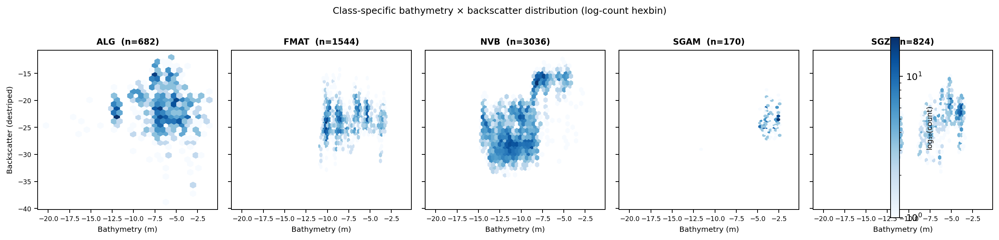

In [14]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

_df = pd.read_csv(f'{FEAT_DIR}/train_features_v07.csv',
                  usecols=['bathy', 'backscatter', 'class'])
CLASS_NAMES = ['ALG', 'FMAT', 'NVB', 'SGAM', 'SGZ']

fig, axes = plt.subplots(1, 5, figsize=(15, 3.5), dpi=180,
                         sharex=True, sharey=True)
for ax, cls in zip(axes, CLASS_NAMES):
    sub = _df[_df['class'] == cls]
    hb = ax.hexbin(sub['bathy'], sub['backscatter'],
                   gridsize=30, bins='log', cmap='Blues', mincnt=1)
    ax.set_title(f'{cls}  (n={len(sub)})', fontsize=9, fontweight='bold')
    ax.set_xlabel('Bathymetry (m)', fontsize=8)
    ax.tick_params(labelsize=7)

axes[0].set_ylabel('Backscatter (destriped)', fontsize=8)
fig.suptitle(
    'Class-specific bathymetry × backscatter distribution (log-count hexbin)',
    fontsize=10, y=1.01)
cbar = fig.colorbar(hb, ax=axes, orientation='vertical',
                    fraction=0.015, pad=0.01)
cbar.set_label('log₁₀(count)', fontsize=8)
plt.tight_layout()
plt.show()
del _df

## Feature correlation structure

**Why distance correlation over Pearson.** Pearson correlation detects
only linear dependence. For gradient-boosted tree features — many of
which interact non-linearly, and some of which are categorical integers
— a Pearson-based redundancy screen can miss highly correlated pairs
that a tree would treat as interchangeable. Distance correlation
(Székely, Rizzo & Bakirov 2007, *Annals of Statistics*) equals
zero if and only if two continuous random variables are statistically
independent, regardless of the form of dependence. We use the unbiased
estimator `dcor.u_distance_correlation_sqr`.

**What the dendrogram reveals.** The figure below was computed on the
subset of features that passed a Boruta feature-selection screen
(confirmed + tentative, approximately 50 features from the extended
candidate pool), using Ward linkage on the (1 − dcor) dissimilarity
matrix. Three super-clusters are visible: a bathymetric magnitude and
focal-statistics cluster (left branch), a roughness-and-texture cluster
spanning multi-scale roughness, GLCM, and rank-entropy features (centre),
and a shape-and-direction cluster containing curvature variants, aspect
derivatives, and multi-scale topographic position features (right). The
wave-travel-time feature (T_east) cuts into the shape cluster at medium
dissimilarity, reflecting partial non-linear overlap with depth-proxy
features but retaining independent information — consistent with it
being the second-highest-gain feature in the final model.

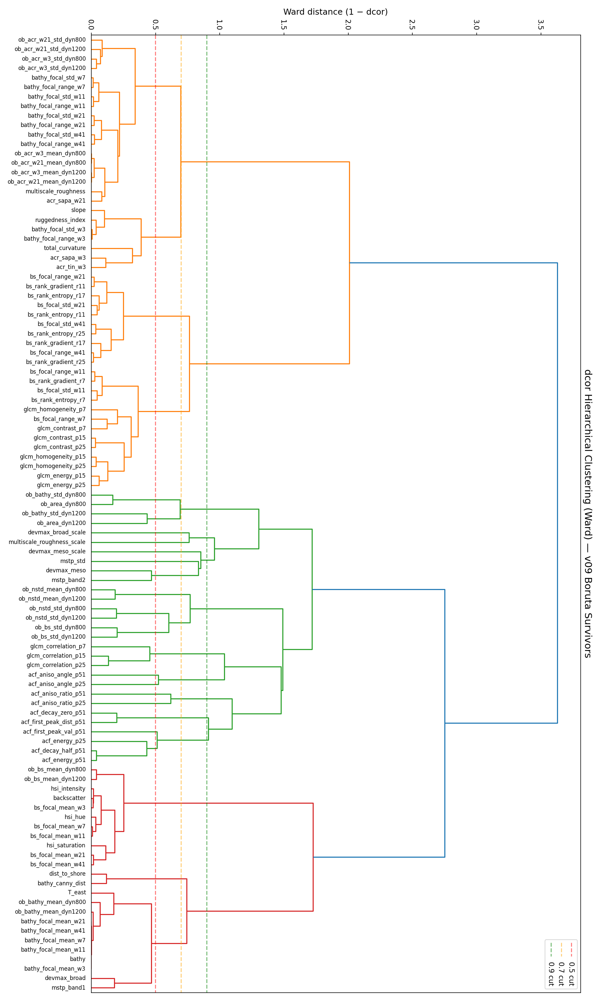

In [15]:
from IPython.display import Image, display
display(Image(f'{FIGURES}/dcor_dendrogram_v09.png'))

In [16]:
# Distance-correlation dendrogram — source: run_boruta_dcor.py (D3 section)
# NOTE: the pairwise dcor computation on ~50 features × 6256 rows
# takes ~20–30 minutes; the pre-computed matrix is at
# outputs/dcor_matrix_v09.csv.  The code below is the exact recipe.

# from dcor import distance_correlation
# from scipy.cluster.hierarchy import linkage, dendrogram
# from scipy.spatial.distance import squareform
# import matplotlib.pyplot as plt
#
# survivors = [confirmed + tentative Boruta features, ~50 columns]
# X_surv = df[survivors].values   # (6256, ~50)
#
# n = len(survivors)
# dcor_matrix = np.ones((n, n))
# for i in range(n):
#     for j in range(i + 1, n):
#         mask = ~(np.isnan(X_surv[:, i]) | np.isnan(X_surv[:, j]))
#         dc = distance_correlation(X_surv[mask, i], X_surv[mask, j])
#         dcor_matrix[i, j] = dcor_matrix[j, i] = dc
#
# dist_condensed = squareform(1 - dcor_matrix, checks=False)
# Z = linkage(dist_condensed, method='ward')
#
# fig, ax = plt.subplots(figsize=(20, 12))
# dendrogram(Z, labels=survivors, leaf_rotation=90, leaf_font_size=8, ax=ax)
# ax.set_ylabel('Ward distance (1 − dcor)', fontsize=12)
# ax.axhline(y=0.5, color='red',    linestyle='--', alpha=0.5, label='0.5 cut')
# ax.axhline(y=0.7, color='orange', linestyle='--', alpha=0.5, label='0.7 cut')
# ax.axhline(y=0.9, color='green',  linestyle='--', alpha=0.5, label='0.9 cut')
# plt.tight_layout()

## Multi-Scale Topographic Position (MSTP)

MSTP encodes where a pixel sits relative to its surroundings across a
hierarchy of spatial scales — local (metres), meso (tens of metres), and
broad (hundreds of metres). The three DEVmax rasters (deviation-from-mean
elevation at each scale) are normalised and packed into the RGB channels
of a composite image. To quote Lindsay (2019, *Geosciences* 9(322)):
"Pixels that are blue are most deviated (either elevated or low-lying)
at the local scale, green pixels are most deviated at the intermediate
scale, and reddish pixels are most deviated at the broadest tested scale
range."

The composite immediately resolves the major structural zones of
Refuge Cove: the granitic reef margins appear blue-shifted where
small-scale roughness dominates; the broad interior soft-sediment zone
is red-shifted, reflecting its depth position relative to surrounding
topography; the transitional seagrass patches occupy intermediate
(green-to-cyan) hues. This visual separability inspired the ecological
two-hypothesis framework explored after the competition deadline —
see the discussion post https://www.kaggle.com/competitions/geohab-mlwg-competition-2026/discussion/695461. The figure below appeared in
that published post and shows the MSTP composite with predicted class
boundaries; the two marked points are incidental to the ecological
analysis.

**Tabular extraction.** When the three MSTP band rasters are sampled at
training-point coordinates, only the local-scale band (band 1) earns
meaningful gradient-boosted tree gain: rank 11/87, gain 1,961. The
meso-scale band (band 2) is mid-tier (rank 32, gain 127); broad-scale
band 3 and the MSTP standard deviation are noise-tier (ranks 62 and 47,
gains ~17 and ~49). The meso- and broad-scale position information is
already well-represented by other features. Worth noting: the visual
power of the MSTP composite substantially exceeds its tabular
contribution. Whether a richer extraction — patch-level descriptors of
the composite image rather than per-pixel point samples — would close
that gap is an open question.

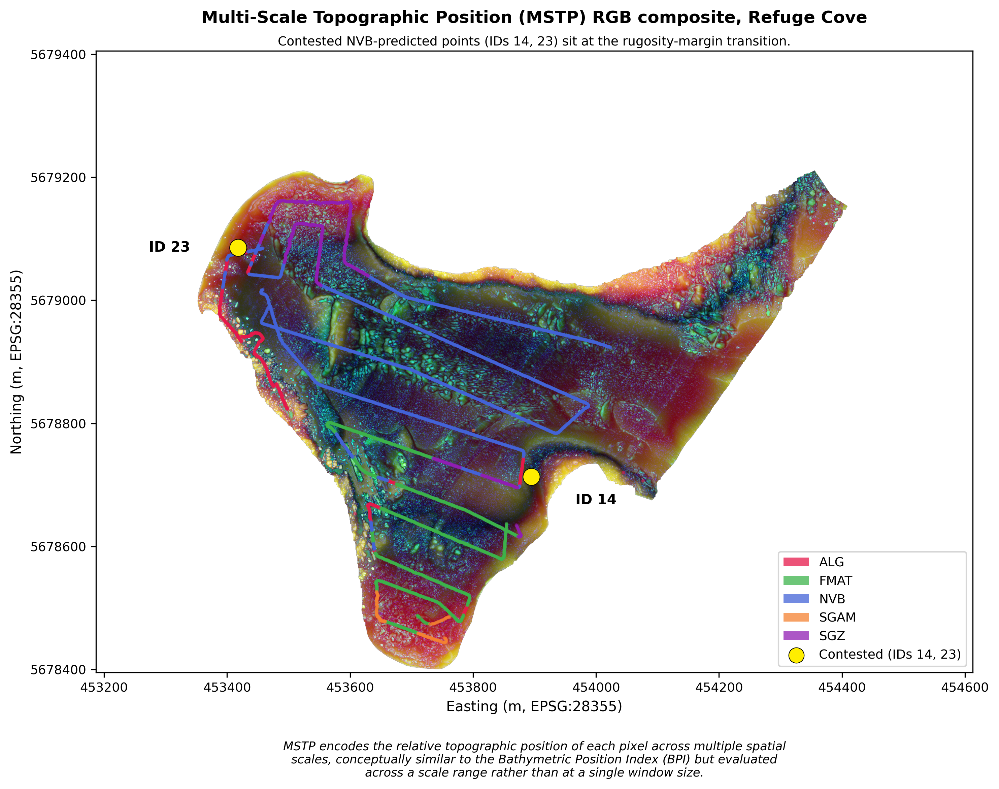

In [17]:
from IPython.display import Image, display
# Figure appeared in the competition discussion post https://www.kaggle.com/competitions/geohab-mlwg-competition-2026/discussion/695461
display(Image(f'{FIGURES}/mstp_map.png'))

**3D MSTP colorbar cube** (perceptual colormap design):

| Channel | Scale |
|---------|-------|
| RED | Topographic prominence at BROAD scale |
| GREEN | Topographic prominence at MESO scale |
| BLUE | Topographic prominence at MICRO scale |

> *"Pixels that are blue are most deviated (either elevated or low-lying) at the local scale,
> green pixels are most deviated at the intermediate scale, and reddish pixels are most deviated
> at the broadest tested scale range. Of course, you can also have combinations therein, e.g.,
> a yellow pixel is one that is deviated at the intermediate and broad scales but not particularly
> deviated at the local scale."* — Lindsay (2023)


In [18]:
from IPython.display import Image, display
# Source: https://mycartablog.com/wp-content/uploads/2026/04/cmap.png
display(Image(url='https://mycartablog.com/wp-content/uploads/2026/04/cmap.png', width=600))


## Wave travel-time proxy (T_east)

**Physical mechanism.** The fast-marching method (FMM; Sethian 1996)
propagates a wave front from a source line using a local speed function.
Here the speed is the shallow-water phase velocity c = √(g·h),
where g = 9.81 m·s⁻² and h is water depth (positive). The source is the
eastern N–S cut at the boundary of the survey extent. The resulting
raster encodes, at each pixel, the travel time for wave energy to arrive
from the east given bathymetric refraction along the path. Long travel
times indicate sheltered interior positions; short travel times indicate
exposed positions near the eastern opening.

**Physical story.** At Refuge Cove the eastern side faces the Tasman Sea
through a partially open channel. The granitic reef habitats occupy
exposed, high-energy zones on the eastern and northern margins; the
seagrass interior occupies the sheltered low-energy basin. T_east is a
direct proxy for this wave-energy partitioning. It is the feature that
most cleanly separates the FMAT–SGZ class pair — the pair that the
ecological analysis identified as substrate-similar but wave-exposure-
differentiated.

**What survived testing.** T_east passed isolation cross-validation with
a +0.011 weighted F1 gain over the baseline, and ranked second in the
full 87-feature model by gradient-boosted tree gain (12,324 units).
Three null-hypothesis variants were tested and eliminated: a FMM
computed from the W/S/N coastline boundary (−0.002 vs baseline — the
coastline encodes general distance-to-boundary, not directional wave
exposure); a constant-speed Euclidean distance transform from the east
(r = 0.989 with T_east — informationally redundant at this site geometry);
and a perpendicular shoreline distance (useful as a large-scale depth
proxy but not as a wave-exposure proxy). Only the directional FMM from
the eastern opening carries independent signal.

Refuge Cove opens to the east toward Bass Strait (Ierodiaconou et al. 2018); wave energy arrives predominantly from this direction, making T_east a proxy for exposure.


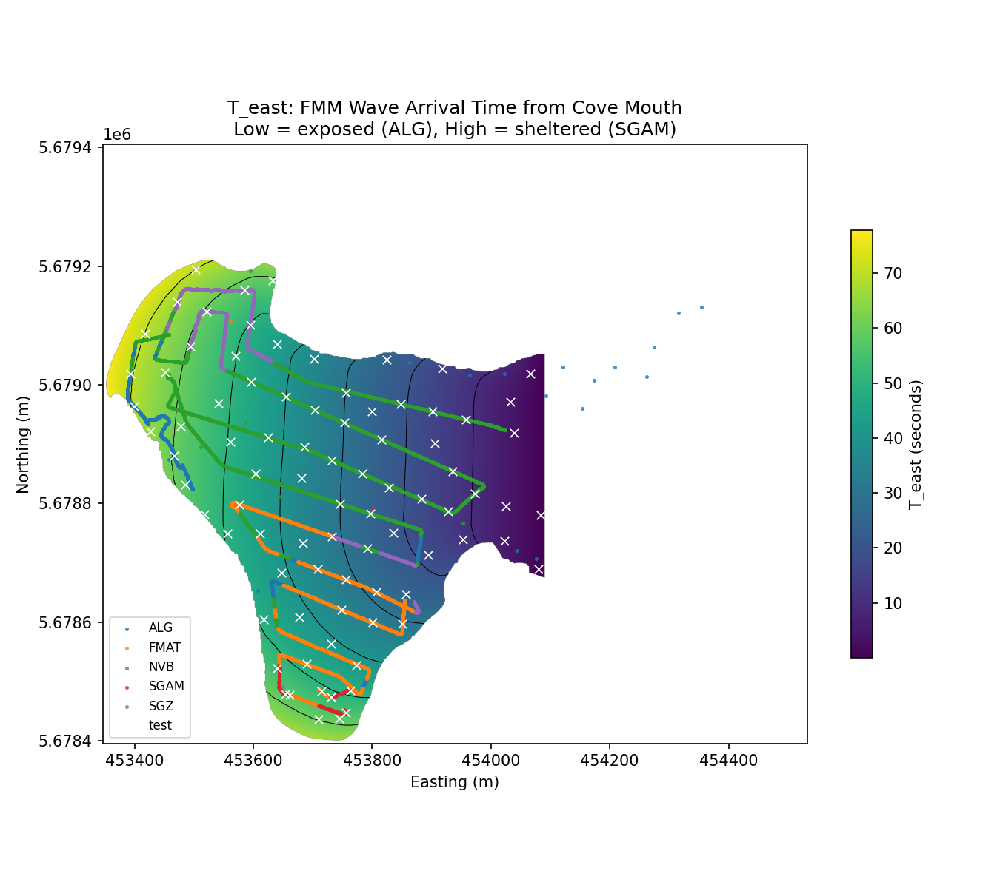

In [19]:
from IPython.display import Image, display
# T_east raster over the survey area with training-point class overlay
display(Image(f'{FIGURES}/fmm_t_east_map.png'))

In [20]:
# T_east extraction from pre-computed FMM raster
# The wave-arrival-time raster was computed in Session 27 using skfmm
# (scikit-fmm) with speed = sqrt(9.81 * abs(bathy)), source mask at
# the eastern N-S cut line.  The TIF is at data/derived/fmm_wave_arrival_time.tif.
#
# Extraction recipe (from run_fmm_cv.py):
import rasterio
import numpy as np

def extract_at_points(tif_path, xs, ys):
    """Sample a raster at (x, y) coordinates using pixel-floor indexing."""
    with rasterio.open(tif_path) as src:
        t  = src.transform
        nd = src.nodata
        data = src.read(1)
    cols = ((xs - t[2]) / t[0]).astype(int)
    rows = ((ys - t[5]) / t[4]).astype(int)
    vals = data[rows, cols].astype(float)
    if nd is not None:
        vals[vals == nd] = np.nan
    return vals

# Usage (requires local raster):
# fmm_t_east_train = extract_at_points(
#     'data/derived/fmm_wave_arrival_time.tif',
#     train_df['x'].values, train_df['y'].values)
# fmm_t_east_test  = extract_at_points(
#     'data/derived/fmm_wave_arrival_time.tif',
#     test_df['x'].values, test_df['y'].values)
print("extract_at_points() defined.")

extract_at_points() defined.


## Acquisition destripe for CNN patch preparation

Raw MBES backscatter contains acquisition stripes — periodic intensity
banding in the across-track direction from angular-response variation
across sonar swaths. At 0.25 m pixel resolution the stripe spatial
frequency falls within the range that dominates texture features in
96×96 pixel CNN patch windows. A CNN trained on striped patches learns
the acquisition geometry rather than the seafloor. FFT-based destripe
removes the stripe frequency band by masking a directional region in
the 2D power spectrum, then inverse-transforming. Bathymetry is
destriped with the same filter for input consistency.

The figure below is a four-panel diagnostic: raw raster (top-left),
FFT-destriped raster (top-right), difference raster (bottom-left), and
focal-range residual (bottom-right). The periodic banding is visible in
the raw panel, absent from the destriped panel, and isolated in the
difference. An interactive Destrip Explorer notebook
(`notebooks/destriping_filter_explorer.ipynb`) enables parameter sweep
without re-running the FFT: it loads pre-computed destriped rasters at
each parameter state and renders both rasters and the difference via
datashader for real-time comparison.

```python
# Destrip Explorer inner loop (pseudocode)
for params in parameter_grid:
    destriped = load_precomputed(params)   # no FFT recompute
    diff = raw - destriped
    img_raw  = datashader.render(raw,       cmap='gist_earth')
    img_filt = datashader.render(destriped, cmap='gist_earth')
    img_diff = datashader.render(diff,      cmap='RdBu_r', center=0)
    display(img_raw, img_filt, img_diff)
```

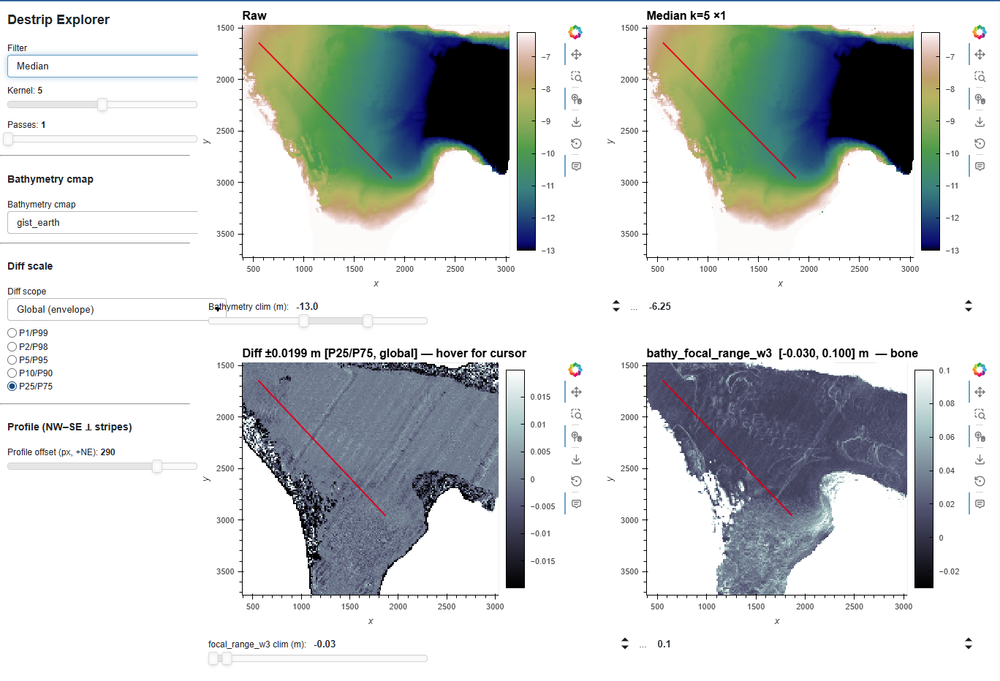

In [21]:
from IPython.display import Image, display
# 4-panel: raw | destriped | diff | focal-range residual
display(Image(f'{FIGURES}/destrip_4panel.png'))

`bathy_canny_dist` is the single most impactful feature: distance in metres
from the nearest Canny edge detected on the bathymetric raster. An isolation
cross-validation test confirmed it is the sole mechanism behind a +0.071
weighted F1 jump when the feature was added — removing every other new feature
and keeping only this one reproduced the full gain.

The recipe follows Rosebrock (2015): auto-tune Canny thresholds from the
median pixel intensity (σ = 0.33), detect edges on the [0, 255]-rescaled
bathymetry, then apply a Euclidean distance transform. The result encodes
proximity to bathymetric structural features — reef-edge crests, slope breaks,
terrace edges — as a continuous field. Points deep inside homogeneous zones
carry large values; points near structural breaks carry small values.
The spatial figure below (left) shows the feature's geographic pattern; the
box plots (right) show that reef-associated classes cluster at short edge
distances while soft-sediment interior classes occupy longer ones.

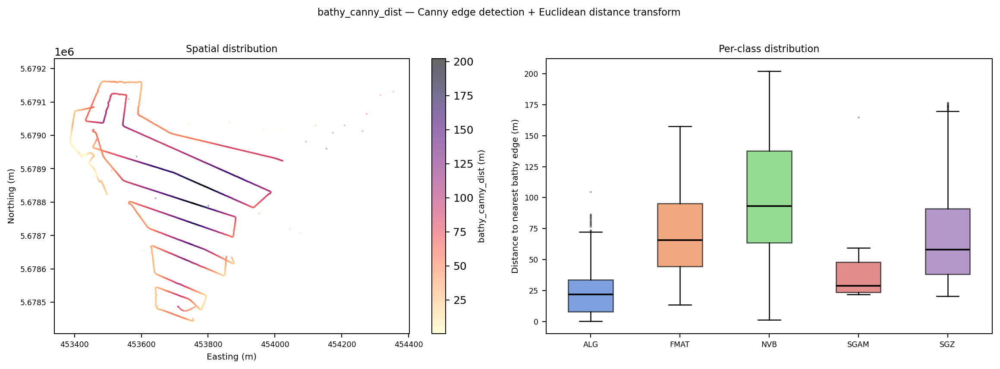

In [22]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

_df = pd.read_csv(f'{FEAT_DIR}/train_features_v07.csv',
                  usecols=['x', 'y', 'bathy_canny_dist', 'class'])
CLASS_NAMES = ['ALG', 'FMAT', 'NVB', 'SGAM', 'SGZ']
CLASS_COLORS = {'ALG': '#4878d0', 'FMAT': '#ee854a', 'NVB': '#6acc65',
                'SGAM': '#d65f5f', 'SGZ': '#956cb4'}

fig, axes = plt.subplots(1, 2, figsize=(13, 4.5), dpi=180)

ax = axes[0]
sc = ax.scatter(_df['x'], _df['y'], c=_df['bathy_canny_dist'],
                cmap='magma_r', s=2, alpha=0.6, lw=0)
cb = fig.colorbar(sc, ax=ax)
cb.set_label('bathy_canny_dist (m)', fontsize=8)
ax.set_title('Spatial distribution', fontsize=9)
ax.set_xlabel('Easting (m)', fontsize=8)
ax.set_ylabel('Northing (m)', fontsize=8)
ax.tick_params(labelsize=7)
ax.set_aspect('equal')

ax = axes[1]
data_per_class = [_df.loc[_df['class'] == c, 'bathy_canny_dist'].dropna().values
                  for c in CLASS_NAMES]
bp = ax.boxplot(data_per_class, labels=CLASS_NAMES, patch_artist=True,
                medianprops={'color': 'black', 'linewidth': 1.5},
                flierprops={'marker': '.', 'markersize': 2, 'alpha': 0.3})
for patch, cls in zip(bp['boxes'], CLASS_NAMES):
    patch.set_facecolor(CLASS_COLORS[cls])
    patch.set_alpha(0.7)
ax.set_title('Per-class distribution', fontsize=9)
ax.set_ylabel('Distance to nearest bathy edge (m)', fontsize=8)
ax.tick_params(labelsize=7)

fig.suptitle('bathy_canny_dist — Canny edge detection + Euclidean distance transform',
             fontsize=9, y=1.01)
plt.tight_layout()
plt.show()
del _df

In [23]:
# bathy_canny_dist — production implementation
# Source: src/cooper_extract.py, auto_canny_cv2_distance()
# Reference: Rosebrock (2015) auto-threshold + scipy Euclidean distance transform

import cv2
import numpy as np
import scipy as sp

PIXEL_SIZE = 0.25  # metres (config.py)

def auto_canny_cv2_distance(bathy):
    """Auto-tuned Canny edge detection, then Euclidean distance to nearest edge.

    Returns distance-to-edge in metres (continuous), NaN outside survey.
    Median computed on valid pixels only.  Rosebrock (2015) + scipy EDT.
    """
    valid_mask = np.isfinite(bathy)
    valid_vals = bathy[valid_mask]
    bmin, bmax = float(valid_vals.min()), float(valid_vals.max())
    arr = np.where(valid_mask,
                   (bathy - bmin) / (bmax - bmin) * 255.0,
                   0.0)
    bathy_uint8 = arr.astype(np.uint8)

    v = float(np.median(bathy_uint8[valid_mask]))
    sigma = 0.33
    lower = int(max(0,   (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    canny = cv2.Canny(bathy_uint8, lower, upper)

    # distance_transform_edt computes distance to nearest 0 pixel;
    # invert so edges (255) become 0 and interiors are positive.
    non_edge = ~(canny > 0)
    dist_px  = sp.ndimage.distance_transform_edt(non_edge)
    dist_m   = dist_px * PIXEL_SIZE

    dist_m = dist_m.astype(np.float32)
    dist_m[~valid_mask] = np.nan
    return dist_m, lower, upper, int((canny > 0).sum())

print("auto_canny_cv2_distance() defined.")

auto_canny_cv2_distance() defined.


## Arc-Chord Ratio (ACR) rugosity

Standard rugosity metrics conflate roughness with slope: a steeply tilted but
featureless seabed appears rough simply because its surface area exceeds its
horizontal footprint. The Arc-Chord Ratio (Du Preez 2015, *Landscape Ecology*
30(1):181–192) decouples the two by dividing 3D contoured surface area by a
**slope-corrected** planar denominator. Two denominator variants are
implemented — TIN/POBF (plane of best fit over the full window) and SAPA
(per-cell slope correction, equivalent to the BTM implementation). Both are
computed in a single vectorised pass via `acr_dual_fast` using integral images,
keeping the computation O(1) per window regardless of window size.

The SAPA variant at a 21-pixel window (5.25 m) is the 87th feature in the
final model, adding +0.016 OOF weighted F1 gain over the 86-feature baseline.
It ranks first by gain among all features added after the initial baseline —
the model exploits the slope-decoupled roughness signal that the WbW rugosity
index, which does not correct for slope, partially conflates with terrain tilt.

*Note: the figure shows residual NW–SE acquisition stripes inherited from the multibeam survey track pattern. These are present in the destriped bathymetry inputs — the 5×5 median filter reduces but does not fully eliminate fine-scale inter-track elevation differences, which the ACR computation amplifies, particularly at the fine-scale w=3 (0.75 m) window.*

In [24]:
# Arc-Chord Ratio — vectorised dual-method implementation
# Source: notebooks/acr_rugosity.ipynb, Cell 4 (acr_dual_fast)
# Reference: Du Preez (2015), Landscape Ecology 30(1):181-192
# Do NOT use the naive loop (Cell 3) for production — it is for validation only.

import numpy as np

def _per_cell_triangle_areas(z, pixel_size):
    dx = dy = pixel_size
    z_tl=z[:-1,:-1]; z_tr=z[:-1,1:]; z_bl=z[1:,:-1]; z_br=z[1:,1:]
    e1=z_bl-z_tl; e2=z_br-z_tl
    area_a = 0.5*np.sqrt((dy*(e2-e1))**2 + (e1*dx)**2 + (dy*dx)**2)
    e1b=z_br-z_tl; e2b=z_tr-z_tl
    area_b = 0.5*np.sqrt((dy*e2b)**2 + (dx*(e1b-e2b))**2 + (dy*dx)**2)
    return area_a + area_b

def _per_cell_slope_planar_area(z, pixel_size):
    dx = dy = pixel_size
    z_tl=z[:-1,:-1]; z_tr=z[:-1,1:]; z_bl=z[1:,:-1]; z_br=z[1:,1:]
    dzdx = 0.5*((z_tr-z_tl)+(z_br-z_bl))/dx
    dzdy = 0.5*((z_bl-z_tl)+(z_br-z_tr))/dy
    return (dx*dy)*np.sqrt(dzdx**2+dzdy**2+1.0)

def _integral_image(arr):
    ii = np.zeros((arr.shape[0]+1, arr.shape[1]+1))
    ii[1:,1:] = np.cumsum(np.cumsum(arr, axis=0), axis=1)
    return ii

def _rect_sum(ii, r0, c0, h, w):
    return ii[r0+h,c0+w]-ii[r0,c0+w]-ii[r0+h,c0]+ii[r0,c0]

def acr_dual_fast(z, pixel_size, window):
    """Compute TIN/POBF and SAPA ACR in one pass using integral images.

    Returns (acr_tin, acr_sapa) — both shape z.shape, NaN at boundary/nodata.
    acr_tin  = 3D area / POBF planar area   (Du Preez 2015 Method 1)
    acr_sapa = 3D area / slope-corrected area (SAPA, BTM-equivalent)
    """
    assert window % 2 == 1
    nrows, ncols = z.shape
    half = window // 2; N = window
    cell_a  = _per_cell_triangle_areas(z, pixel_size)
    slope_a = _per_cell_slope_planar_area(z, pixel_size)
    nan_ii  = _integral_image(np.isnan(z).astype(np.float64))
    ca_ii   = _integral_image(np.where(np.isnan(cell_a),  0.0, cell_a))
    sp_ii   = _integral_image(np.where(np.isnan(slope_a), 0.0, slope_a))
    z_c = np.where(np.isnan(z), 0.0, z)
    z_ii    = _integral_image(z_c)
    col_idx = np.arange(ncols, dtype=np.float64)
    row_idx = np.arange(nrows, dtype=np.float64)
    zcol_ii = _integral_image(z_c * col_idx[None, :])
    zrow_ii = _integral_image(z_c * row_idx[:, None])
    acr_tin  = np.full((nrows, ncols), np.nan)
    acr_sapa = np.full((nrows, ncols), np.nan)
    rs, re = half, nrows-half
    cs, ce = half, ncols-half
    if rs >= re or cs >= ce:
        return acr_tin, acr_sapa
    rr=np.arange(rs,re); cc=np.arange(cs,ce)
    r0=rr-half; c0=cc-half; w1=N-1
    nan_cnt  = _rect_sum(nan_ii, r0[:,None], c0[None,:], N,  N)
    contoured= _rect_sum(ca_ii,  r0[:,None], c0[None,:], w1, w1)
    sapa_den = _rect_sum(sp_ii,  r0[:,None], c0[None,:], w1, w1)
    var_1d   = (N**2-1)/12.0
    z_sum    = _rect_sum(z_ii,    r0[:,None], c0[None,:], N, N)
    zcol_sum = _rect_sum(zcol_ii, r0[:,None], c0[None,:], N, N)
    zrow_sum = _rect_sum(zrow_ii, r0[:,None], c0[None,:], N, N)
    denom_fit= N*N*pixel_size*var_1d
    a = (zcol_sum - cc[None,:]*z_sum) / denom_fit
    b = (zrow_sum - rr[:,None]*z_sum) / denom_fit
    cos_t    = 1.0/np.sqrt(a**2+b**2+1.0)
    tin_den  = ((N-1)*pixel_size)**2 / cos_t
    nm       = nan_cnt > 0
    r_tin    = contoured/tin_den;  r_tin[nm]  = np.nan
    r_sapa   = contoured/sapa_den; r_sapa[nm] = np.nan
    acr_tin[rs:re,cs:ce]  = r_tin
    acr_sapa[rs:re,cs:ce] = r_sapa
    return acr_tin, acr_sapa

print("acr_dual_fast() defined  (TIN + SAPA in a single integral-image pass).")

acr_dual_fast() defined  (TIN + SAPA in a single integral-image pass).


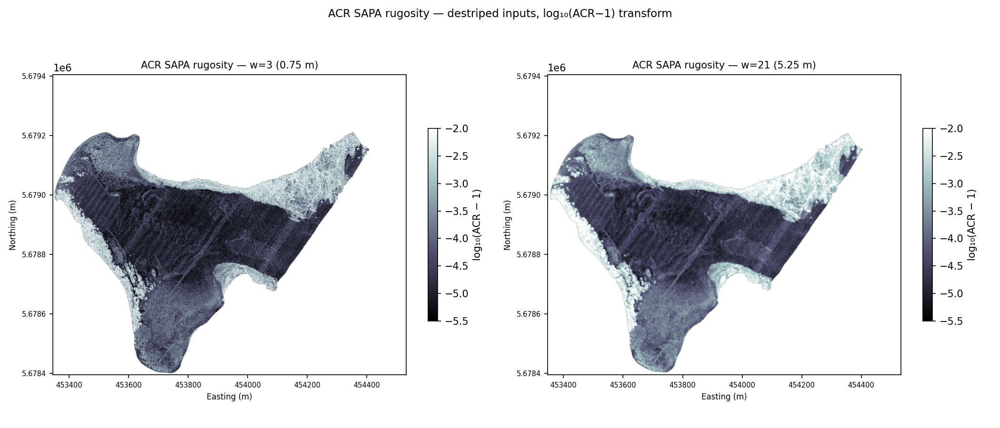

In [25]:
from IPython.display import Image, display
# SAPA ACR at w=3 (0.75 m) and w=21 (5.25 m) — spatial pattern across the survey
display(Image(f'{FIGURES}/acr_rugosity_w3_w21.png'))

## Spatial cross-validation — verde BlockKFold at 150 m

**Why spatial CV.** Benthic survey data is spatially autocorrelated: a
training point and a nearby held-out point share similar habitat context,
so the held-out point is not independent of the training set.
StratifiedKFold ignores spatial position entirely, producing test folds
where held-out points are "too close" to their training neighbours. Verde
`BlockKFold` (Uieda et al. 2020, *JOSS*) partitions the survey area into
a regular grid of spatial blocks and assigns whole blocks to folds, so
train and validation sets are separated by at least one block width. Here
the block width is 150 m, chosen to match the median indicator-variogram
range across the five habitat classes (186–414 m; multi-lag re-run,
Session 33H).

**Calibration.** A dummy-classifier baseline (most-frequent strategy,
5-fold 150 m BlockKFold) returns a weighted F1 of **0.3330**. The full
model achieves 0.7688 ± SE 0.0133 — a lift of +0.4358 over the content-
free floor. Importantly, the dummy baseline under the 150 m scheme is not
lower than under StratifiedKFold (0.3171 most-frequent under random CV).
The spatial splitter does not mechanically deflate floor performance;
any degradation real models show under 150 m CV is genuine generalisation
cost.

**Leakage from strip-aligned features.** Because the fold pattern
organises blocks into approximately N–S strips (Figure 1 below), a
feature that is a linear function of northing becomes a fold-index proxy:
the model can use it to infer which fold a point belongs to, inflating
OOF F1 without generalisation. This was confirmed by a pre-registered
paired test: northing alone improved OOF F1 by +0.032, but permutation-
importance analysis showed collapse — 9 of the 10 top baseline features
lost ≥50 % of their importance to northing. By contrast, radial features
whose iso-value contours cross multiple fold boundaries are not
susceptible. The distance-from-creek-mouth contours in Figure 2 illustrate
the geometry: the iso-distance lines are approximately circular and
intersect all five fold strips, so the feature cannot encode fold
identity. A post-deadline ecological investigation into contested test-
point predictions is on the competition discussion page https://www.kaggle.com/competitions/geohab-mlwg-competition-2026/discussion/695461.

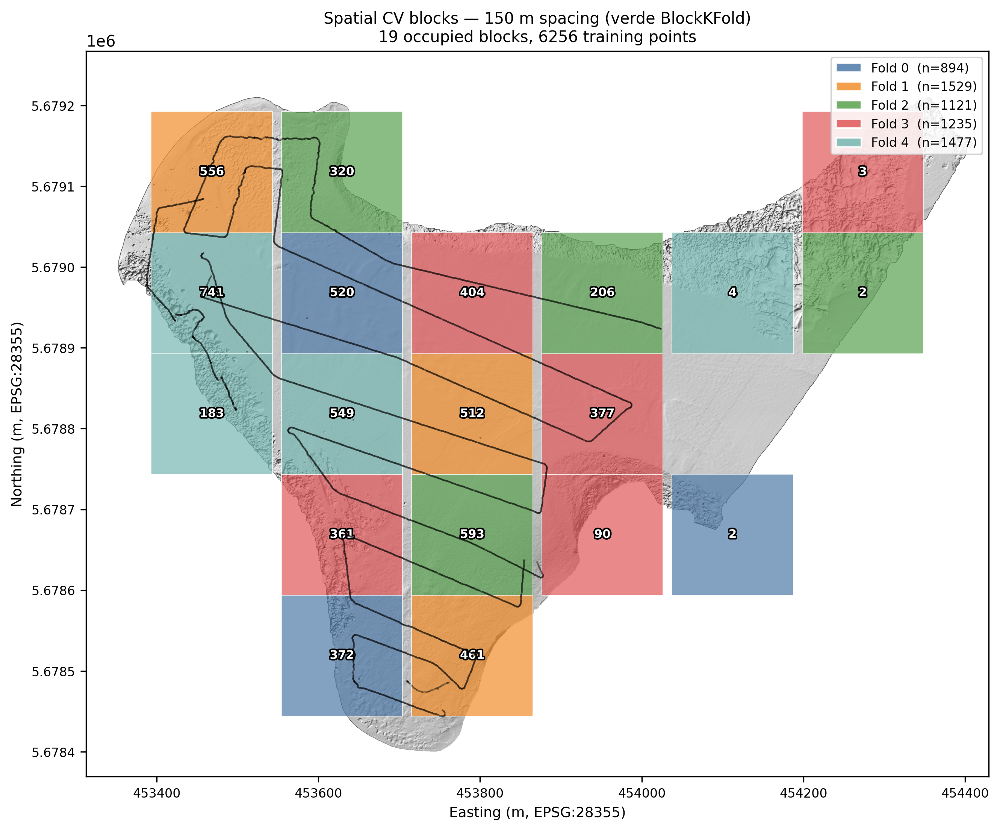

In [26]:
from IPython.display import Image, display
# Figure 1 — 150m BlockKFold spatial layout with fold colour coding
display(Image(f'{FIGURES}/cv_blocks_150m.png'))

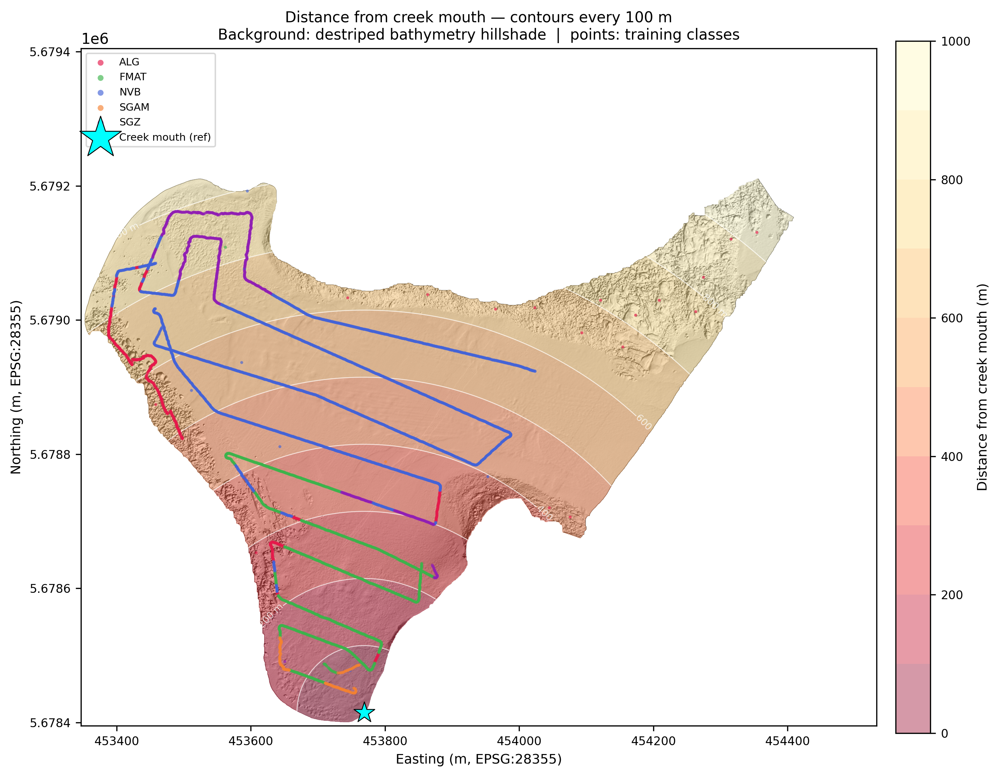

In [27]:
from IPython.display import Image, display
# Figure 2 — distance-from-creek-mouth contours (radial geometry contrast)
display(Image(f'{FIGURES}/dist_creek_contours.png'))

In [28]:
import verde as vd
import numpy as np
import pandas as pd
import os

# Canonical BlockKFold instantiation
# Verified dead code: build_ensemble_outputs.py (commit 27c364a)
kfold_check = vd.BlockKFold(
    spacing=150, n_splits=5, shuffle=True, random_state=42
)

# Fold-equivalence assertion — verbatim from src/exp_depth_kde_isolation.py
_fold_csv = os.path.join('..', 'outputs', '_kaggle_features_bundle',
                         'fold_indices.csv')
if os.path.exists(_fold_csv) and 'train_coords' in dir():
    _fold_df = pd.read_csv(_fold_csv)
    _folds_list = list(kfold_check.split(train_coords))
    _verde_assignments = np.zeros(len(train_coords), dtype=int)
    for _f_idx, (_, _val_idx) in enumerate(_folds_list):
        _verde_assignments[_val_idx] = _f_idx
    assert np.array_equal(_fold_df['fold'].values, _verde_assignments), (
        "ABORT: BlockKFold assignments do not match kaggle_dataset/fold_indices.csv"
    )
    print("Fold verification PASSED — bit-for-bit match with canonical fold file.")
else:
    print("Fold CSV or train_coords not available in this environment — skipping assertion.")
    print("Canonical call: vd.BlockKFold(spacing=150, n_splits=5, shuffle=True, random_state=42)")

Fold CSV or train_coords not available in this environment — skipping assertion.
Canonical call: vd.BlockKFold(spacing=150, n_splits=5, shuffle=True, random_state=42)


## Bayesian prior adjustment

**Why the mismatch exists.**  Training labels come from dive transect surveys with their own spatial sampling design, concentrated on particular habitat transitions and survey corridors within Refuge Cove. The 98 test points have a different spatial footprint across the cove. The result is that class proportions in training do not match the expected class proportions at prediction targets. A model that outputs calibrated probabilities under the training distribution will produce miscalibrated predictions on a test set with different class prevalence — a standard problem in ecological survey data where training samples are rarely drawn from the same distribution as the prediction targets.

**The correction.**  Bayes’ theorem provides a principled adjustment: multiply the model’s predicted probability for each class by the ratio of the test-set prior to the training-set prior, then renormalise so probabilities sum to 1, then take the argmax class. The formula is `P_adj[c] = P_raw[c] × (test_prior[c] / train_prior[c])`. This is not ad-hoc threshold tuning — it is a direct application of Bayes’ rule to account for a known shift in class prevalence between training and deployment.

**The ratios and what they say.**  Test priors are from Ierodiaconou et al. (2018), which maps habitat proportions across Refuge Cove from the full acoustic survey footprint.

| Class | Train % | Test % | Ratio |
|-------|----------|---------|-------|
| ALG   |  10.90   |  29.60  | **2.72** |
| FMAT  |  24.68   |  17.30  | **0.70** |
| NVB   |  48.53   |  36.70  | **0.76** |
| SGAM  |   2.72   |   6.10  | **2.24** |
| SGZ   |  13.17   |  10.20  | **0.77** |

ALG (reef) and SGAM (*Amphibolis* seagrass) are 2–3× more prevalent in the test distribution than in training — the model needs to be told these habitats are proportionally more common at the test-point locations. NVB (bare sand, 48.5 % of training) is downweighted because the test set is less dominated by featureless sand than the dive transects.

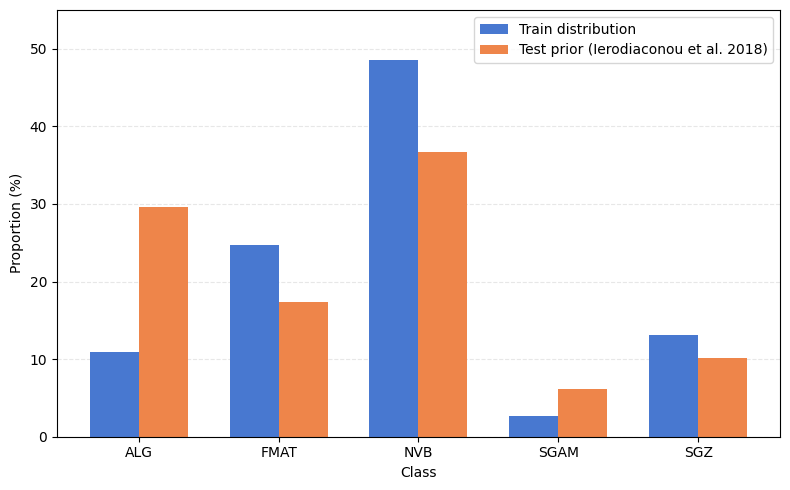

In [29]:
import numpy as np
import matplotlib.pyplot as plt

# Class proportions: verified against data/features/train_features_v07.csv
# and CONFIG TRAIN_PRIOR / TEST_PRIOR (Ierodiaconou et al. 2018)
CLASS_NAMES_ = ['ALG', 'FMAT', 'NVB', 'SGAM', 'SGZ']
TRAIN_PCT_   = [10.90, 24.68, 48.53,  2.72, 13.17]
TEST_PCT_    = [29.60, 17.30, 36.70,  6.10, 10.20]

x = np.arange(len(CLASS_NAMES_))
w = 0.35

fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(x - w/2, TRAIN_PCT_, w, label='Train distribution',
       color='#4878d0', zorder=2)
ax.bar(x + w/2, TEST_PCT_,  w, label='Test prior (Ierodiaconou et al. 2018)',
       color='#ee854a', zorder=2)

ax.set_xticks(x)
ax.set_xticklabels(CLASS_NAMES_)
ax.set_xlabel('Class')
ax.set_ylabel('Proportion (%)')
ax.set_ylim(0, 55)
ax.yaxis.grid(True, alpha=0.3, linestyle='--')
ax.set_axisbelow(True)
ax.legend(framealpha=0.8)
plt.tight_layout()
plt.show()


## Feature engineering backbone

Eighty-six terrain features underpin the tabular component of the pipeline,
all derived from two input rasters (destriped bathymetry and backscatter)
using WhiteboxWorkflows for Python (Lindsay 2019, *Geosciences* 9(322)).
The feature set spans three scale tiers: local (sub-metre to ~2 m), meso
(tens of metres), and broad (hundreds of metres), following the Scale Mosaic
Hypothesis (Lindsay 2023, Geomorphometry keynote) — meaningful landform
interpretation requires decomposing the topographic signal into scale-specific
components, because the habitats of interest span different characteristic
scales. Granitic boulder texture resolves at sub-metre scale; reef-platform
extent resolves at the tens-of-metres scale; basin-depth gradients only become
visible at the hundreds-of-metres scale. No single window captures all three.

The meso-scale DEVmax raster (local deviation from mean elevation, scales
20–200 m) shown below captures the reef-crest relief and sand-channel
depth contrasts that form the dominant habitat boundaries at Refuge Cove.
By permutation importance, `multiscale_roughness` ranks first at 0.202 —
the integrated roughness signal across the full scale range proves more
predictive than any single derivative.

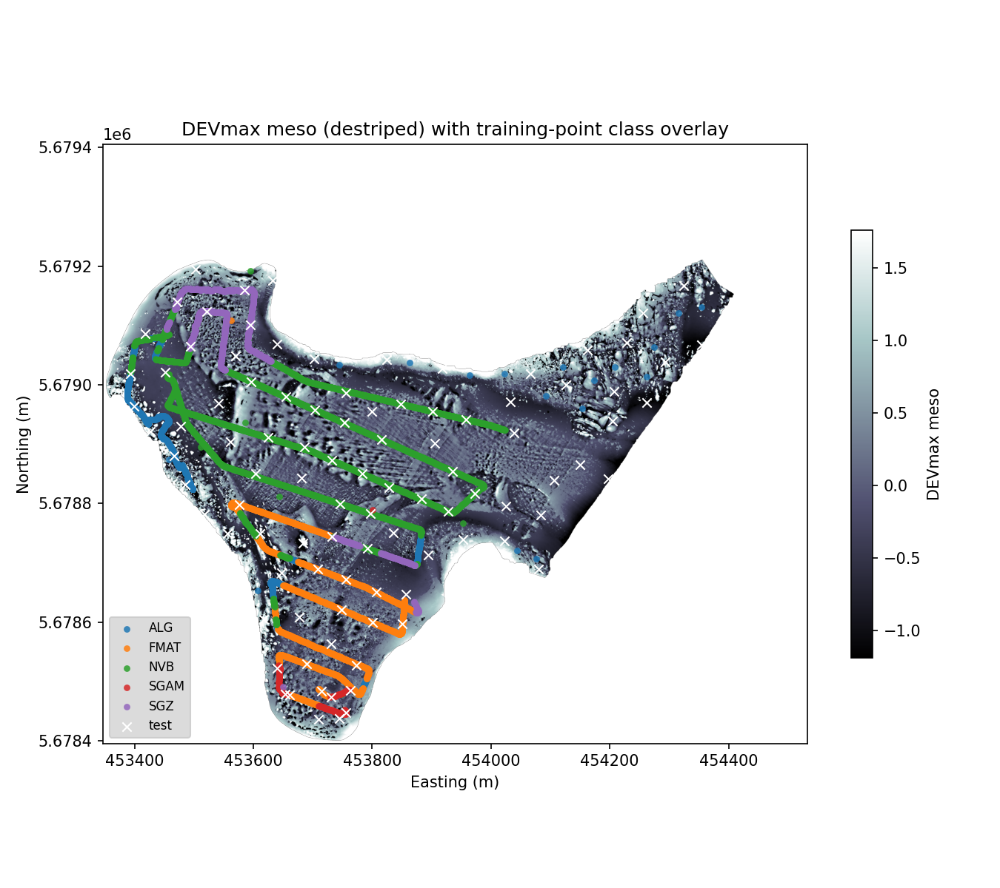

In [30]:
from IPython.display import Image, display
# DEVmax meso raster with all training-point class overlay
display(Image(f'{FIGURES}/devmax_meso.png'))

## Additional methods explored

### HiGRA hierarchical segmentation

HiGRA (Najman et al. 2019) constructs a hierarchical watershed
segmentation from any scalar raster. Applied to destriped bathymetry,
it defines coherent spatial objects — patches of reef, sediment, or
transition zone — whose per-segment statistics might encode habitat-scale
texture not visible at per-pixel resolution. A single dynamics threshold
controls the minimum elevation contrast between adjacent basins needed
to merge them; different thresholds produce dramatically different
segment counts and boundaries (Figure 1, four dynamics levels). The
threshold chosen for the core experiment (dyn = 800) yields approximately
800 segments. Per-segment rugosity statistics passed initial cross-
validation, but regressed on the public leaderboard — the third such
regression across three independently-selected segmentation algorithms.
Post-experiment analysis identified the mechanism: points within the
same segment receive identical per-segment feature values, so effective
training-sample size collapses from the point count to the segment
count, and spatial cross-validation cannot detect the resulting
pseudoreplication (Figure 2 shows the conditional statistics that
appeared internally promising). Object-based zonal statistics on any
segmentation of this dataset are closed pending a mechanistically
different formulation.

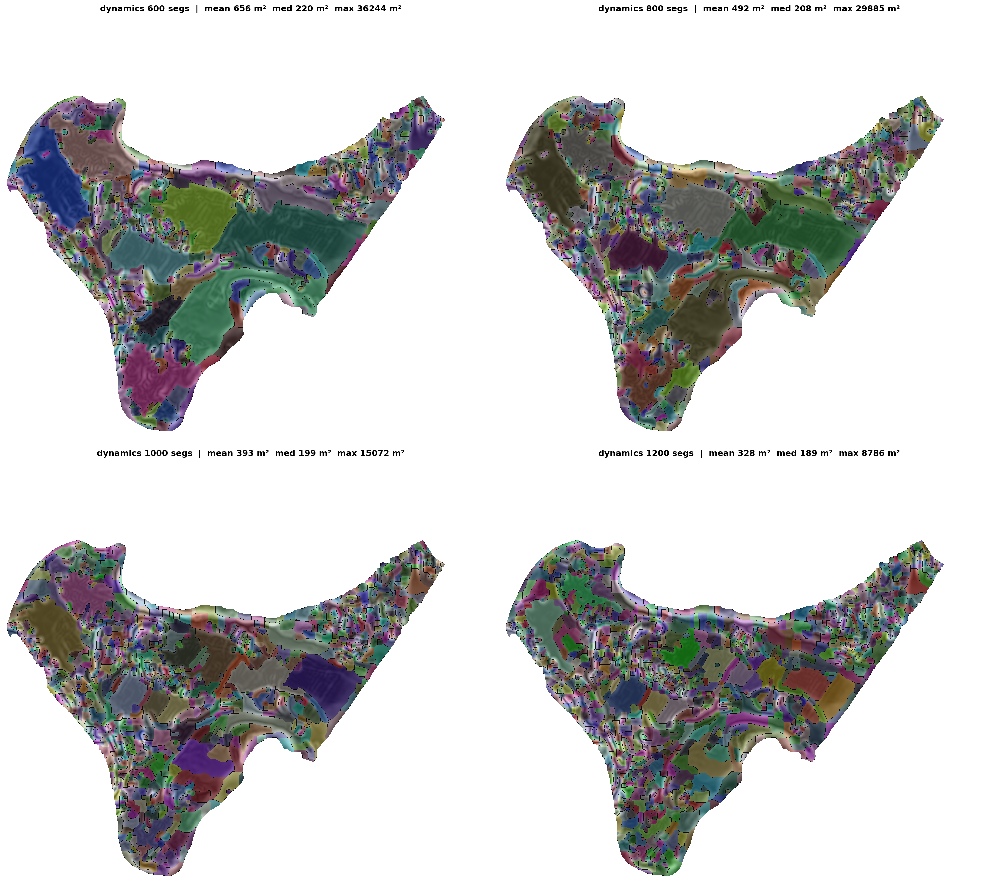

In [31]:
from IPython.display import Image, display
# Figure 1 — HiGRA dynamics sweep: segments at dyn=600/800/1200/2000
display(Image(f'{FIGURES}/higra_4panel.png'))

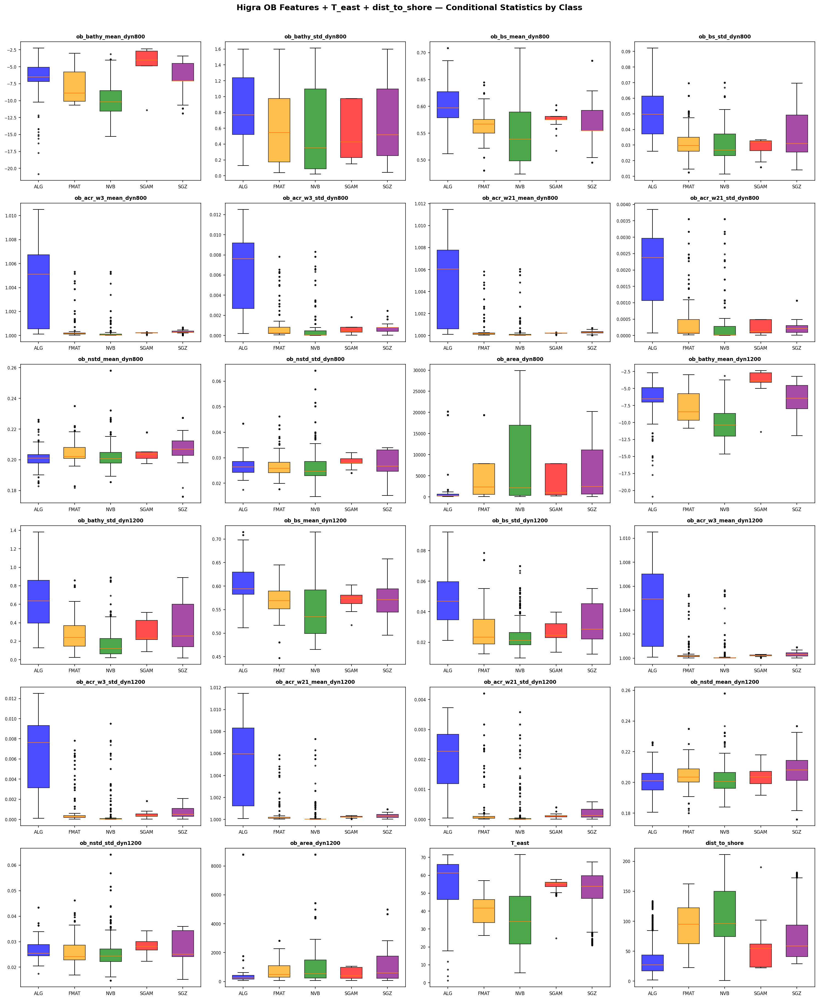

In [32]:
from IPython.display import Image, display
# Figure 2 — conditional statistics that passed internal gates
display(Image(f'{FIGURES}/higra_conditional_stats.png'))

### Unsupervised clustering

As a sanity check, K-means (k = 5) and a Gaussian mixture model
(n = 5) were applied to the raw bathymetry × destriped-backscatter
feature space — the same 2D space shown in the bivariate histograms
above. The question: does the natural cluster structure of the acoustic
signal recover the five habitat classes without labels?

Neither method recovers the true class structure (figure below). The
K-means and GMM clusters roughly partition the depth axis but cut
across class boundaries wherever two habitat types co-occur in the
same depth zone — most visibly in the overlap near the mid-range depth
interval. This is the expected result and is itself informative: a
model that performs well on this problem is exploiting higher-
dimensional structure not visible in raw bathymetry and backscatter
alone. The engineered feature set adds terrain geometry, multi-scale
roughness, backscatter texture, and wave-exposure proxies that
collectively move the problem out of this two-dimensional null.

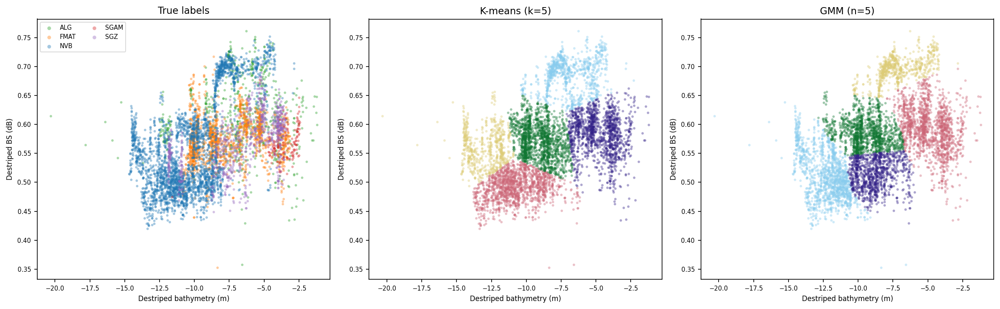

In [33]:
from IPython.display import Image, display
# 3-panel: true labels | K-means (k=5) | GMM (n=5)
# Generated from data/features/train_features_v07.csv bathy + backscatter columns
# KMeans(n_clusters=5, random_state=42, n_init=10),
# GaussianMixture(n_components=5, random_state=42)
display(Image(f'{FIGURES}/unsupervised_3panel.png'))

### Blanket-method fractal analysis

The Carmichael (1996) blanket method extracts fractal dimension and
asymmetry from acoustic backscatter intensity, grounded in a physically
motivated hypothesis: volume-scattering habitats (hard reef, coralline
algae) should exhibit spatially rougher acoustic textures than specular-
reflecting soft sediments, and this roughness should manifest as a
higher fractal dimension and larger asymmetry between upper and lower
blanket envelopes. After a required upstream rescale to the canonical
[0, 255] integer regime (Peleg 1984), the method computed valid features
— fractal dimension values near 2.18 (the fBm-smooth end of the range),
95th-percentile asymmetry 0.177. Both permutation importance and
gradient-boosted tree gain placed all three blanket features in the
zero-contribution cluster. The physical interpretation: Refuge Cove
backscatter at 0.25 m pixel resolution does not exhibit the substrate-
roughness heterogeneity the method requires — dimension values cluster
too tightly to separate classes. Right method, wrong site at this pixel
scale and site geometry. Full diagnostic is in `docs/dead_ends.md`.